In [2]:

# Loading the packages
if(!require("caret")){install.packages("caret")}
if(!require("tidyverse")){install.packages("tidyverse")}
if(!require("ISLR2")){install.packages("ISLR2")}
if(!require("boot")){install.packages("boot")}
if(!require("MASS")){ install.packages("MASS")}
if(!require("leaps")){ install.packages("leaps")}
if(!require("glmnet")){ install.packages("glmnet")}
if(!require("e1071")){ install.packages("e1071")}

if(!require("pROC")){ install.packages("pROC")}
if(!require("class")){ install.packages("class")}
if(!require("reshape2")){ install.packages("reshape2")}
if(!require("klaR")){ install.packages("klaR")}
if(!require("ggpubr")){ install.packages("ggpubr")}
if(!require("plotly")){ install.packages("plotly")}
if(!require("kernlab")){ install.packages("kernlab")}#for svm model 
if(!require("ada")){ install.packages("ada")}#for ada model 
if(!require("mboost")){ install.packages("mboost")}#for ada model 


library(ada)
library(mboost)
library(kernlab)
library(glmnet)
library(bestglm)
library(naivebayes)

library(corrgram) #correlation diagram
library(ggpubr)
library(plotly) #for making subplots
library(boot)
library(caret)  # Package for machine learning modelling functions.
library(tidyverse)
library(ISLR2)
library(MASS)
library(corrplot)
library(leaps)

library(e1071) # If you face an issue on mac for installing this package use https://wlu.syzygy.ca platform for practice
library(pROC)
library(class)
library(ggplot2)
library(klaR)
library(dplyr)
library(caret)
library(e1071)
library(pROC)

library(reshape2)
library(rpart)
library(rpart.plot)
library(randomForest)
library(neuralnet)

Loading required package: caret

Loading required package: ggplot2

Loading required package: lattice

Loading required package: tidyverse

── Attaching packages ─────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.2 ──
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
✔ purrr   1.0.1     
── Conflicts ────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
✖ purrr::lift()   masks caret::lift()
Loading required package: ISLR2

Loading required package: boot


Attaching package: ‘boot’


The following object is masked from ‘package:lattice’:

    melanoma


Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:ISLR2’:

    Boston


The following object is m

# Pre-processing

In [3]:
raw_data_path <- "../data/raw/heart.csv"
interim_data_path <- '../data/interim/'
final_data_path <- '../data/processed/'
data<- read.csv(raw_data_path)

#convert character columns and response variable to factor
data[,c(2,3,7,9,11,12)] <- lapply(data[,c(2,3,7,9,11,12)], factor)

head(data)
dim(data)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
,<int>,<fct>,<fct>,<int>,<int>,<int>,<fct>,<int>,<fct>,<dbl>,<fct>,<fct>
1,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
2,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
3,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
4,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
5,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0
6,39,M,NAP,120,339,0,Normal,170,N,0.0,Up,0


[1] 918  12

In [471]:

#Check for missing values
colSums(is.na(data)) #none found

#Check for duplicates in data set
sum(duplicated(data)) #none found



Age            Sex  ChestPainType      RestingBP    Cholesterol 
             0              0              0              0              0 
     FastingBS     RestingECG          MaxHR ExerciseAngina        Oldpeak 
             0              0              0              0              0 
      ST_Slope   HeartDisease 
             0              0

[1] 0

Lets understand the variables in the dataset:
- Age - Age of the patient(years)
- Sex - Biological sex of the patient
- ChestPainType - The type of chest pain experienced (TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic)
- RestingBP - Resting Blood Pressure (mm Hg)
- Cholesterol - Cholesterol level (mm/dl)
- FastingBS - Blood sugar level after fasting (if FastingBS > 120 then 1, otherwise 0)
- RestingECG - Resting ECG levels (Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria)
- MaxHR - Maximum heart rate achieved (Numeric value between 60 to 202)
- ExerciseAngina - Exercise-induced angina (Y = Yes, N = No)
- Oldpeak - ST depression induced by exercise relative to rest (ST is a flat section of the ECG)
- ST_Slope - the slope of the peak exercise ST segment (Up: upsloping, Flat: flat, Down: downsloping)
- HeartDisease - output class (1 = heart disease, 0 = Normal)


In [468]:
#Get descriptive stats
summary(data)

      Age        Sex     ChestPainType   RestingBP      Cholesterol   
 Min.   :28.00   F:193   ASY:496       Min.   :  0.0   Min.   :  0.0  
 1st Qu.:47.00   M:725   ATA:173       1st Qu.:120.0   1st Qu.:173.2  
 Median :54.00           NAP:203       Median :130.0   Median :223.0  
 Mean   :53.51           TA : 46       Mean   :132.4   Mean   :198.8  
 3rd Qu.:60.00                         3rd Qu.:140.0   3rd Qu.:267.0  
 Max.   :77.00                         Max.   :200.0   Max.   :603.0  
   FastingBS       RestingECG      MaxHR       ExerciseAngina    Oldpeak       
 Min.   :0.0000   LVH   :188   Min.   : 60.0   N:547          Min.   :-2.6000  
 1st Qu.:0.0000   Normal:552   1st Qu.:120.0   Y:371          1st Qu.: 0.0000  
 Median :0.0000   ST    :178   Median :138.0                  Median : 0.6000  
 Mean   :0.2331                Mean   :136.8                  Mean   : 0.8874  
 3rd Qu.:0.0000                3rd Qu.:156.0                  3rd Qu.: 1.5000  
 Max.   :1.0000        

From the above output, we see that there is a clear outlier in RestingBP- this si the minimum value which is 0. In reality, this is impractical so this observation is incorrect and will be removed. 

In [4]:
data = data %>% filter(RestingBP > 0)

#save to processed data
path = paste(interim_data_path, "processed_data.csv")
write.csv(data,  path)

# EDA

## Correlation analysis

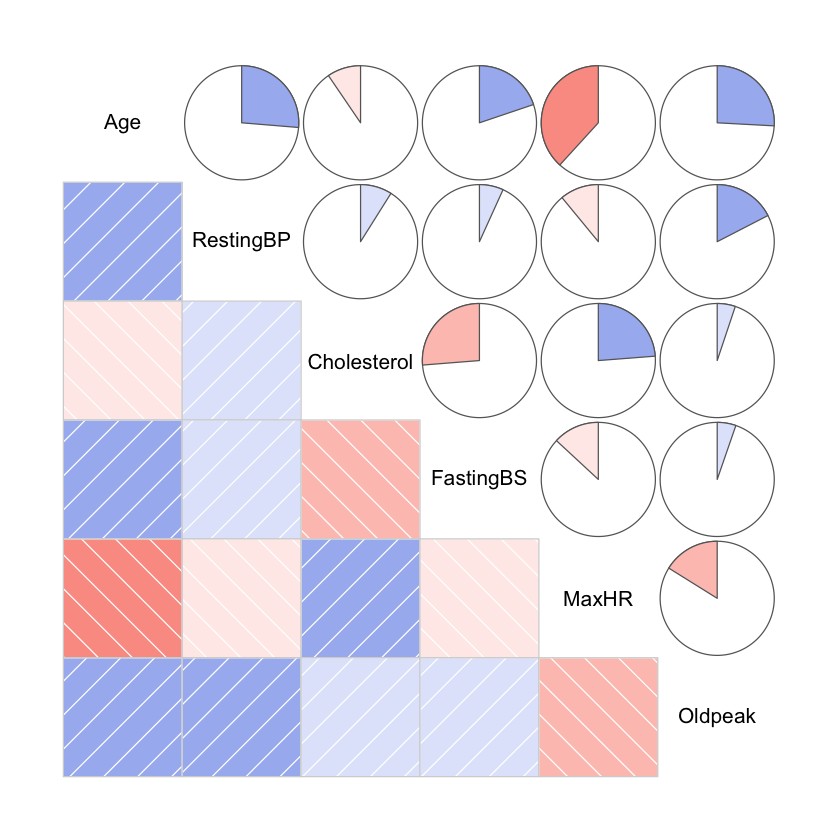

In [92]:


data %>% corrgram(lower.panel = panel.shade,upper.panel = panel.pie)


## Graphical analysis 

### Categorical variables 

In [287]:
# Select categorical variables except 'HeartDisease'
cat_vars <- colnames(data[,sapply(data, is.factor) & colnames(data) != "HeartDisease"])

plot_density <- function(df,var1){
  var1name <- as.name(var1)
  p <- df %>%
    ggplot(aes(x = {{var1name}}, fill = HeartDisease)) + 
    geom_bar(position = "dodge") + 
    scale_fill_brewer(palette = "Accent")
    return(p)
}

In [87]:
cat_plot <- subplot(
    plot_density(data, cat_vars[1]),
    plot_density(data, cat_vars[2]),
    plot_density(data, cat_vars[3]),
    plot_density(data, cat_vars[4]),
    plot_density(data, cat_vars[5]),
    nrows = 2, margin = 0.07)%>%
        layout(annotations = list(
        list(x = 0.1, y = 1.0, text = cat_vars[1], xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.5, y = 1.0, text = cat_vars[2], xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.9, y = 1.0, text = cat_vars[3], xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.1, y = 0.45, text = cat_vars[4], xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.5, y = 0.45, text = cat_vars[5], xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE)
        ))

cat_plot

HTML widgets cannot be represented in plain text (need html)

### Continuous variables 

In [113]:
#plot the continuous variables 
con_plot <- subplot(
    ggdensity(data, x = "Age", fill = "HeartDisease", palette = "npg"),
    ggdensity(data, x = "RestingBP", fill = "HeartDisease", palette = "npg"),
    ggdensity(data, x = "Cholesterol", fill = "HeartDisease", palette = "npg"),
    ggdensity(data, x = "MaxHR",  fill = "HeartDisease", palette = "npg"),
    ggdensity(data, x = "Oldpeak",  fill = "HeartDisease", palette = "npg"),
    ggdensity(data, x = "FastingBS",  fill = "HeartDisease", palette = "npg"),
    nrows = 2, margin = 0.07)%>%
        layout(annotations = list(
        list(x = 0.1, y = 1.0, text = "Age", xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.5, y = 1.0, text = "RestingBP", xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.9, y = 1.0, text = "Cholesterol", xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.1, y = 0.4, text = "MaxHR", xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.5, y = 0.4, text = "Oldpeak", xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE),
        list(x = 0.9, y = 0.4, text = "FastingBS", xref = "paper", yref = "paper", xanchor = "center", yanchor = "bottom", showarrow = FALSE)
        ))

con_plot


HTML widgets cannot be represented in plain text (need html)

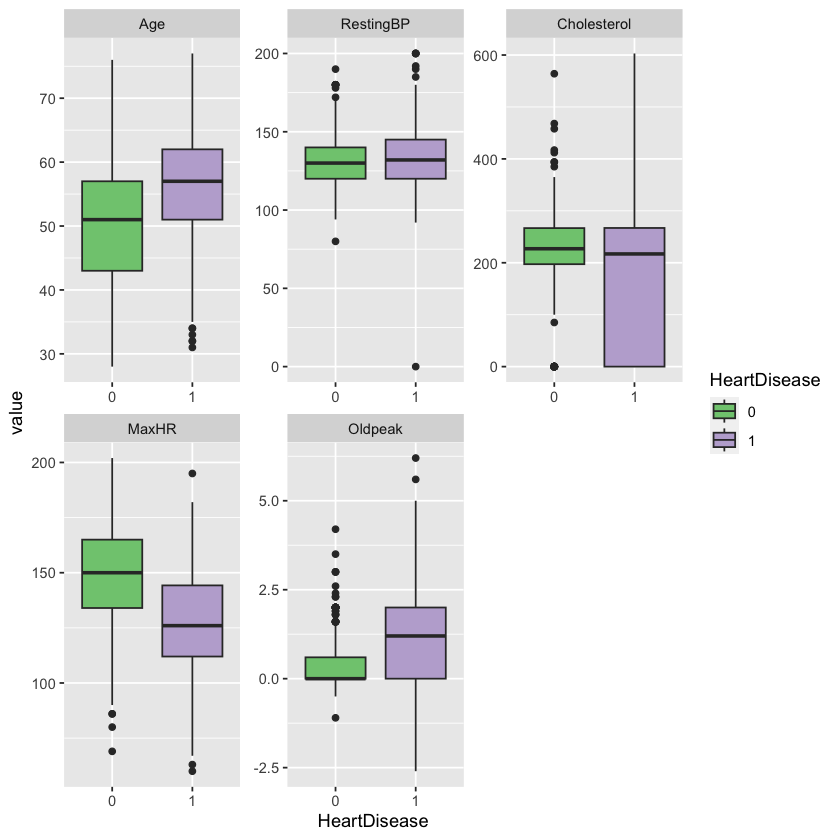

In [122]:
#visualize via boxplots
data %>% select(HeartDisease, Age, RestingBP, Cholesterol, MaxHR, Oldpeak)%>% 
    melt(id.var="HeartDisease") %>% #melt is function from reshape2 package
    ggplot(aes(x=HeartDisease, y=value, fill=HeartDisease)) + 
    geom_boxplot() +
    facet_wrap(~variable,ncol = 3, scales="free") + scale_fill_brewer(palette = "Accent")

In [51]:
data <- data[,!names(data) %in% c("RestingBP")] #remove restingBP 

RestingBP has very similar distribution for both classes; there doesn't appear to be a seperable plane - can consider drpoping this variable

# Training 

## Train-Test split

In [63]:
set.seed(5)
# set HeartDisease = Yes i.e. 1 as 'true' variable
levels(data$HeartDisease)=c("No", "Yes")
# data$HeartDisease <- relevel(data$HeartDisease, ref = "Yes")

# create a 70/30 split of data.
train <-  sample_frac(data,0.7)
train_idx <- as.numeric(rownames(train))
test <-data[-train_idx, ]


#save to final data
write.csv(train,  paste(final_data_path, "train.csv"))
write.csv(train,  paste(final_data_path, "test.csv"))

## modelling and evaluation 

In [4]:
#Read in train and test data
train<- read.csv(paste(final_data_path, "train.csv"))
test<- read.csv(paste(final_data_path, "test.csv"))

In [5]:
set.seed(5)
formula <- HeartDisease ~ .

#pre-process : standardize test and train sets after splitting 
preProcValues <- preProcess(train, method = c("center", "scale"))
trainSet <- predict(preProcValues, train) 
test <- predict(preProcValues, test)

cv <- trainControl(
    method = "repeatedcv", # repeatedcv, LOOCV
    number = 10, # folds
    repeats = 3,
    summaryFunction = twoClassSummary,  
    classProbs = TRUE,
    p = 0.7 # Percent of data used for training,  
)


In [5]:
# Classic classification algos 
res_logistic <- train(formula,data = trainSet, trControl = cv,method = "glm", family = binomial, metric="ROC")
res_lda <- train(formula, data = trainSet, trControl = cv, method = "lda",metric="ROC")
res_qda <- train(formula, method = "qda", data = trainSet, trControl = cv,metric="ROC")
res_nb <- train(formula, method = "naive_bayes", data = trainSet, trControl = cv,metric="ROC")
res_knn <- train(formula, data=trainSet, method="knn", trControl=cv, metric="ROC")


#perform variable selection using AIC 
res_glm_AIC <- train(formula, data = trainSet, trControl = cv, family = binomial, method = "glmStepAIC",metric="ROC")
res_lda_step <- train(formula, data = trainSet, trControl = cv, method = "stepLDA",metric="ROC")




Start:  AIC=409.7
.outcome ~ X + Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- RestingECGST      1   377.73 407.73
- X                 1   377.82 407.82
- MaxHR             1   378.30 408.30
- ChestPainTypeTA   1   378.35 408.35
- RestingECGNormal  1   378.67 408.67
- ST_SlopeFlat      1   378.95 408.95
- Age               1   379.55 409.55
<none>                  377.70 409.70
- Oldpeak           1   381.34 411.34
- Cholesterol       1   382.97 412.97
- ST_SlopeUp        1   387.37 417.37
- SexM              1   388.93 418.93
- FastingBS         1   390.87 420.87
- ExerciseAnginaY   1   392.19 422.19
- ChestPainTypeATA  1   398.70 428.70
- ChestPainTypeNAP  1   402.47 432.47

Step:  AIC=407.73
.outcome ~ X + Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Choles


Step:  AIC=390.67
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + ExerciseAnginaY + 
    Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
<none>                  366.67 390.67
- ST_SlopeFlat      1   369.32 391.32
- Oldpeak           1   369.76 391.76
- Age               1   370.54 392.54
- ChestPainTypeTA   1   372.44 394.44
- FastingBS         1   373.53 395.53
- ST_SlopeUp        1   376.85 398.85
- SexM              1   378.45 400.45
- ExerciseAnginaY   1   379.50 401.50
- Cholesterol       1   379.53 401.53
- ChestPainTypeATA  1   388.58 410.58
- ChestPainTypeNAP  1   392.12 414.12
Start:  AIC=398.91
.outcome ~ X + Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- RestingECGNormal  1   367.01 397.01


Step:  AIC=387.36
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    ExerciseAnginaY + Oldpeak + ST_SlopeUp

                   Df Deviance    AIC
- Age               1   364.61 386.61
- RestingECGNormal  1   365.18 387.18
<none>                  363.36 387.36
- ChestPainTypeTA   1   368.21 390.21
- Oldpeak           1   369.44 391.44
- Cholesterol       1   372.16 394.16
- ExerciseAnginaY   1   373.76 395.76
- FastingBS         1   374.18 396.18
- SexM              1   383.34 405.34
- ChestPainTypeATA  1   389.17 411.17
- ChestPainTypeNAP  1   391.54 413.54
- ST_SlopeUp        1   449.72 471.72

Step:  AIC=386.61
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + RestingECGNormal + ExerciseAnginaY + 
    Oldpeak + ST_SlopeUp

                   Df Deviance    AIC
- RestingECGNormal  1   365.96 385.96
<none>                  364.61 386.61
- ChestPai


Step:  AIC=406.89
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- Age               1   379.29 405.29
- RestingECGNormal  1   379.50 405.50
- MaxHR             1   379.51 405.51
<none>                  378.89 406.89
- ST_SlopeFlat      1   381.71 407.71
- ChestPainTypeTA   1   384.82 410.82
- Oldpeak           1   386.19 412.19
- ST_SlopeUp        1   386.97 412.97
- ExerciseAnginaY   1   388.09 414.09
- Cholesterol       1   388.22 414.22
- FastingBS         1   388.38 414.38
- SexM              1   397.05 423.05
- ChestPainTypeNAP  1   402.43 428.43
- ChestPainTypeATA  1   402.49 428.49

Step:  AIC=405.29
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + RestingECGNormal + MaxHR + ExerciseAnginaY + 
    Oldpeak + ST_SlopeFlat + ST_SlopeUp

  


Step:  AIC=407.49
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- RestingECGST      1   377.52 405.52
- RestingECGNormal  1   377.88 405.88
- MaxHR             1   378.07 406.07
- Age               1   378.83 406.83
<none>                  377.49 407.49
- ChestPainTypeTA   1   380.07 408.07
- ST_SlopeFlat      1   380.23 408.23
- Oldpeak           1   383.61 411.61
- Cholesterol       1   386.23 414.23
- ExerciseAnginaY   1   386.91 414.91
- FastingBS         1   386.95 414.95
- ST_SlopeUp        1   387.40 415.40
- ChestPainTypeATA  1   393.84 421.84
- SexM              1   394.95 422.95
- ChestPainTypeNAP  1   396.94 424.94

Step:  AIC=405.52
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    M


Step:  AIC=387.88
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + ExerciseAnginaY + Oldpeak + ST_SlopeUp

                   Df Deviance    AIC
<none>                  367.88 387.88
- ChestPainTypeTA   1   370.17 388.17
- Oldpeak           1   371.37 389.37
- FastingBS         1   378.12 396.12
- Cholesterol       1   379.74 397.74
- ExerciseAnginaY   1   384.79 402.79
- SexM              1   389.50 407.50
- ChestPainTypeNAP  1   390.72 408.72
- ChestPainTypeATA  1   392.42 410.42
- ST_SlopeUp        1   448.36 466.36
Start:  AIC=388.54
.outcome ~ X + Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- RestingECGST      1   356.66 386.66
- X                 1   356.99 386.99
- RestingECGNormal  1   357.07 387.07
- Age               1   3


Step:  AIC=393.99
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + ExerciseAnginaY + 
    Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- Age               1   370.93 392.93
- ST_SlopeFlat      1   371.42 393.42
<none>                  369.99 393.99
- ChestPainTypeTA   1   372.92 394.92
- Oldpeak           1   375.79 397.79
- FastingBS         1   376.52 398.52
- Cholesterol       1   380.08 402.08
- ExerciseAnginaY   1   381.55 403.55
- ST_SlopeUp        1   383.05 405.05
- ChestPainTypeATA  1   387.59 409.59
- SexM              1   395.37 417.37
- ChestPainTypeNAP  1   396.60 418.60

Step:  AIC=392.93
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- ST_SlopeFlat      1   372.41 392.41
<none>                  370.93 392.93
- ChestPainTypeTA 


Step:  AIC=386.38
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + RestingECGNormal + RestingECGST + 
    MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- RestingECGST      1   358.89 384.89
- RestingECGNormal  1   359.14 385.14
- MaxHR             1   359.18 385.18
<none>                  358.38 386.38
- ChestPainTypeTA   1   361.25 387.25
- ST_SlopeFlat      1   362.30 388.30
- ST_SlopeUp        1   365.60 391.60
- Oldpeak           1   368.33 394.33
- ExerciseAnginaY   1   368.44 394.44
- Cholesterol       1   369.68 395.68
- FastingBS         1   371.80 397.80
- SexM              1   376.76 402.76
- ChestPainTypeATA  1   377.82 403.82
- ChestPainTypeNAP  1   382.28 408.28

Step:  AIC=384.89
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + RestingECGNormal + MaxHR + ExerciseAnginaY + 
    Oldpeak + ST_SlopeFlat + ST_Sl


Step:  AIC=395.65
.outcome ~ X + Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- X                 1   365.79 393.79
- ST_SlopeFlat      1   366.01 394.01
- MaxHR             1   366.36 394.36
- Age               1   366.92 394.92
- ChestPainTypeTA   1   367.57 395.57
<none>                  365.65 395.65
- RestingECGNormal  1   367.76 395.76
- Oldpeak           1   371.85 399.85
- Cholesterol       1   373.73 401.73
- ST_SlopeUp        1   376.67 404.67
- ExerciseAnginaY   1   378.07 406.07
- FastingBS         1   378.52 406.52
- SexM              1   384.86 412.86
- ChestPainTypeATA  1   385.63 413.63
- ChestPainTypeNAP  1   387.89 415.89

Step:  AIC=393.79
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    MaxHR + ExerciseA

                   Df Deviance    AIC
- X                 1   371.38 401.38
- RestingECGST      1   371.39 401.39
- MaxHR             1   371.67 401.67
- Age               1   371.90 401.90
- RestingECGNormal  1   371.92 401.92
<none>                  371.30 403.30
- ST_SlopeFlat      1   375.58 405.58
- ChestPainTypeTA   1   375.94 405.94
- ST_SlopeUp        1   376.50 406.50
- Oldpeak           1   379.92 409.92
- Cholesterol       1   382.32 412.32
- ExerciseAnginaY   1   383.07 413.07
- FastingBS         1   383.54 413.54
- SexM              1   387.01 417.01
- ChestPainTypeATA  1   393.48 423.48
- ChestPainTypeNAP  1   394.80 424.80

Step:  AIC=401.38
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- RestingECGST      1   371.47 399.47
- MaxHR             1   371.73 399.73
- R


Step:  AIC=396.92
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + ExerciseAnginaY + 
    Oldpeak + ST_SlopeUp

                   Df Deviance    AIC
<none>                  374.92 396.92
- Age               1   377.09 397.09
- ChestPainTypeTA   1   378.74 398.74
- Oldpeak           1   379.64 399.64
- Cholesterol       1   385.01 405.01
- FastingBS         1   387.88 407.88
- ExerciseAnginaY   1   388.46 408.46
- SexM              1   392.64 412.64
- ChestPainTypeATA  1   396.42 416.42
- ChestPainTypeNAP  1   397.51 417.51
- ST_SlopeUp        1   453.28 473.28
Start:  AIC=406.22
.outcome ~ X + Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- MaxHR             1   374.33 404.33
- X                 1   374.35 404.35
- RestingECGST


Step:  AIC=401.3
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
<none>                  379.30 401.30
- ST_SlopeFlat      1   381.40 401.40
- ChestPainTypeTA   1   382.33 402.33
- Oldpeak           1   385.70 405.70
- ST_SlopeUp        1   387.37 407.37
- FastingBS         1   390.20 410.20
- Cholesterol       1   391.47 411.47
- SexM              1   393.92 413.92
- ExerciseAnginaY   1   394.60 414.60
- ChestPainTypeNAP  1   401.45 421.45
- ChestPainTypeATA  1   404.95 424.95
Start:  AIC=393.64
.outcome ~ X + Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- RestingECGST      1   361.83 391.83
- MaxHR             1   361.86 391.86
- X   


Step:  AIC=391.33
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + RestingECGNormal + ExerciseAnginaY + 
    Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- RestingECGNormal  1   367.86 389.86
<none>                  367.33 391.33
- ST_SlopeFlat      1   369.89 391.89
- Oldpeak           1   373.40 395.40
- ChestPainTypeTA   1   375.29 397.29
- ST_SlopeUp        1   378.31 400.31
- FastingBS         1   378.86 400.86
- ExerciseAnginaY   1   381.21 403.21
- Cholesterol       1   382.22 404.22
- SexM              1   384.57 406.57
- ChestPainTypeATA  1   390.25 412.25
- ChestPainTypeNAP  1   395.28 417.28

Step:  AIC=389.86
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
<none>                  367.86 389.86
- ST_SlopeFlat      1   370.49 390.49
- Old


Step:  AIC=396.57
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + MaxHR + ExerciseAnginaY + 
    Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- Age               1   371.22 395.22
- MaxHR             1   371.64 395.64
- ChestPainTypeTA   1   371.82 395.82
<none>                  370.57 396.57
- ST_SlopeFlat      1   374.78 398.78
- Oldpeak           1   374.89 398.89
- ST_SlopeUp        1   376.81 400.81
- Cholesterol       1   377.59 401.59
- ExerciseAnginaY   1   381.50 405.50
- FastingBS         1   382.35 406.35
- SexM              1   388.73 412.73
- ChestPainTypeNAP  1   393.39 417.39
- ChestPainTypeATA  1   395.96 419.96

Step:  AIC=395.22
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + ChestPainTypeTA + 
    Cholesterol + FastingBS + MaxHR + ExerciseAnginaY + Oldpeak + 
    ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- ChestPainTypeTA   1   372.38 394.38
- 


Step:  AIC=395.82
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeUp

                   Df Deviance    AIC
- RestingECGST      1   368.26 394.26
- MaxHR             1   368.38 394.38
- Age               1   368.93 394.93
- ChestPainTypeTA   1   369.61 395.61
<none>                  367.82 395.82
- RestingECGNormal  1   370.39 396.39
- Oldpeak           1   372.13 398.13
- Cholesterol       1   373.14 399.14
- ExerciseAnginaY   1   379.01 405.01
- FastingBS         1   379.88 405.88
- SexM              1   390.51 416.51
- ChestPainTypeNAP  1   391.77 417.77
- ChestPainTypeATA  1   393.19 419.19
- ST_SlopeUp        1   441.44 467.44

Step:  AIC=394.26
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeUp

           

                   Df Deviance    AIC
- X                 1   380.88 410.88
- MaxHR             1   381.17 411.17
- RestingECGST      1   381.25 411.25
- Age               1   381.83 411.83
- RestingECGNormal  1   381.92 411.92
<none>                  380.69 412.69
- ST_SlopeFlat      1   383.61 413.61
- ChestPainTypeTA   1   384.07 414.07
- Oldpeak           1   387.72 417.72
- ST_SlopeUp        1   388.22 418.22
- FastingBS         1   391.13 421.13
- ExerciseAnginaY   1   391.23 421.23
- SexM              1   391.34 421.34
- Cholesterol       1   391.88 421.88
- ChestPainTypeATA  1   401.35 431.35
- ChestPainTypeNAP  1   402.20 432.20

Step:  AIC=410.88
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    RestingECGST + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- MaxHR             1   381.33 409.33
- RestingECGST      1   381.42 409.42
- R


Step:  AIC=390.85
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + Cholesterol + 
    FastingBS + MaxHR + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + 
    ST_SlopeUp

                   Df Deviance    AIC
- MaxHR             1   369.57 389.57
<none>                  368.85 390.85
- ST_SlopeFlat      1   371.64 391.64
- Oldpeak           1   374.11 394.11
- ST_SlopeUp        1   378.59 398.59
- FastingBS         1   379.33 399.33
- Cholesterol       1   380.46 400.46
- ExerciseAnginaY   1   385.96 405.96
- SexM              1   386.06 406.06
- ChestPainTypeATA  1   389.68 409.68
- ChestPainTypeNAP  1   391.60 411.60

Step:  AIC=389.57
.outcome ~ SexM + ChestPainTypeATA + ChestPainTypeNAP + Cholesterol + 
    FastingBS + ExerciseAnginaY + Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
<none>                  369.57 389.57
- ST_SlopeFlat      1   372.40 390.40
- Oldpeak           1   374.52 392.52
- FastingBS         1   380.12 398.12
- ST_SlopeUp       


Step:  AIC=437.84
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + RestingECGNormal + 
    ExerciseAnginaY + Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- RestingECGNormal  1   412.88 436.88
- Age               1   413.75 437.75
<none>                  411.84 437.84
- ST_SlopeFlat      1   414.51 438.51
- ChestPainTypeTA   1   415.69 439.69
- Oldpeak           1   418.83 442.83
- ST_SlopeUp        1   422.10 446.10
- FastingBS         1   423.59 447.59
- Cholesterol       1   424.13 448.13
- ExerciseAnginaY   1   425.49 449.49
- SexM              1   432.65 456.65
- ChestPainTypeATA  1   437.14 461.14
- ChestPainTypeNAP  1   439.97 463.97

Step:  AIC=436.88
.outcome ~ Age + SexM + ChestPainTypeATA + ChestPainTypeNAP + 
    ChestPainTypeTA + Cholesterol + FastingBS + ExerciseAnginaY + 
    Oldpeak + ST_SlopeFlat + ST_SlopeUp

                   Df Deviance    AIC
- Age               1   414.28 

 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81152;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
       0.00        0.00        1.79 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82686;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       3.337 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.8199;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       1.042 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.80611;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       1.024 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81821;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
       0.00        0.00        0.84 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81975;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.794 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.8235;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.753 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82178;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.773 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82347;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.749 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

579 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82214;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.812 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81842;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
       0.00        0.00        0.73 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.83037;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.756 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82175;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.821 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82181;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.815 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82008;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
       0.00        0.00        0.83 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.80965;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.704 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82169;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.718 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81476;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.767 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81661;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.803 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81821;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.757 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82015;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.754 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81809;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.763 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.81322;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.763 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82015;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.766 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82199;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.815 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82653;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
       0.00        0.00        0.84 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

579 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.82559;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.789 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

577 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.80947;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
       0.00        0.00        0.83 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.80786;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       1.005 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

578 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.83046;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.848 



 `stepwise classification', using 10-fold cross-validated correctness rate of method lda'.

642 observations of 15 variables in 2 classes; direction: both

stop criterion: improvement less than 5%.



correctness rate: 0.8194;  in: "ST_SlopeUp";  variables (1): ST_SlopeUp 

 hr.elapsed min.elapsed sec.elapsed 
      0.000       0.000       0.862 



#### Fit regularization models  

In [6]:
lambda <- seq(exp(-8), exp(-3), length.out = 100)#10^seq(-3, 3, length = 100)
res_ridge <- train(formula, 
                   data = trainSet, 
                   trControl = cv, 
                   tuneGrid = expand.grid(alpha = 0, lambda = lambda), 
                   method = "glmnet",
                   metric="ROC")
res_lasso <- train(formula, 
                   data = trainSet, 
                   trControl = cv, 
                   tuneGrid = expand.grid(alpha = 1, lambda = lambda), 
                   method = "glmnet",
                   metric="ROC")


In [7]:
#For Ridge and Lasso
# Coefficient of the final model based on best lambda value 
coef(res_ridge$finalModel, res_ridge$bestTune$lambda)
coef(res_lasso$finalModel, res_lasso$bestTune$lambda)

bind_rows(ridge = res_ridge$bestTune, lasso = res_lasso$bestTune)
          


16 x 1 sparse Matrix of class "dgCMatrix"
                           s1
(Intercept)      -0.461401438
X                 0.007869297
Age               0.131080286
SexM              0.981151150
ChestPainTypeATA -1.188194633
ChestPainTypeNAP -0.981037195
ChestPainTypeTA  -0.469286781
Cholesterol      -0.308794836
FastingBS         0.333221896
RestingECGNormal  0.156673307
RestingECGST      0.086666056
MaxHR            -0.190302451
ExerciseAnginaY   0.896689543
Oldpeak           0.346010531
ST_SlopeFlat      0.863788370
ST_SlopeUp       -1.149113401

16 x 1 sparse Matrix of class "dgCMatrix"
                         s1
(Intercept)      -0.2640593
X                 .        
Age               0.1073328
SexM              1.2773058
ChestPainTypeATA -1.6257650
ChestPainTypeNAP -1.3596117
ChestPainTypeTA  -0.6829249
Cholesterol      -0.3886118
FastingBS         0.4041890
RestingECGNormal  0.1130490
RestingECGST      .        
MaxHR            -0.1170276
ExerciseAnginaY   1.0139020
Oldpeak           0.3453678
ST_SlopeFlat      0.7543132
ST_SlopeUp       -1.6253202

alpha,lambda
<dbl>,<dbl>
0,0.038797823
1,0.004831063


#### Fit SVM models with different kernels 

In [8]:
#Fit SVM models with different kernels 
res_svm_radial <-train(formula, data = trainSet, trControl = cv, method = "svmRadial",tuneLength = 8, metric = "ROC")
res_svm_linear <- train(formula, data = trainSet, trControl = cv, method = "svmLinear",tuneLength = 8, metric = "ROC")
res_svm_poly <- train(formula, data = trainSet, method = "svmPoly", trControl = cv, metric = "ROC")

In [9]:
#Compare SVM Models
res2<-as_tibble(res_svm_radial$results[which.min(res_svm_radial$results[,2]),])
res3<-as_tibble(res_svm_linear$results[which.min(res_svm_linear$results[,2]),])
res1<-as_tibble(res_svm_poly$results[which.min(res_svm_poly$results[,2]),])
df<-tibble(Model=c('SVM Radial','SVM Linear','SVM Poly'),
           ROC=c(res2$ROC,res3$ROC,res1$ROC),
           Sens=c(res2$Sens,res3$Sens,res1$Sens),
           Spec=c(res2$Spec,res3$Spec,res1$Spec)
          )
df %>% arrange(ROC)

#There doesnt appear to be a stat difference in models 
compare_models(res_svm_poly, res_svm_linear)
compare_models(res_svm_poly, res_svm_radial)
compare_models(res_svm_linear, res_svm_radial)


Model,ROC,Sens,Spec
<chr>,<dbl>,<dbl>,<dbl>
SVM Poly,0.9203647,0.8906513,0.7794118
SVM Linear,0.9239174,0.8406897,0.9016527
SVM Radial,0.9246464,0.8348276,0.9045098



	One Sample t-test

data:  x
t = 0.55868, df = 29, p-value = 0.5807
alternative hypothesis: true mean is not equal to 0
95 percent confidence interval:
 -0.01126276  0.01972845
sample estimates:
  mean of x 
0.004232847 



	One Sample t-test

data:  x
t = 0.42116, df = 29, p-value = 0.6767
alternative hypothesis: true mean is not equal to 0
95 percent confidence interval:
 -0.01351115  0.02051865
sample estimates:
  mean of x 
0.003503751 



	One Sample t-test

data:  x
t = -0.092107, df = 29, p-value = 0.9272
alternative hypothesis: true mean is not equal to 0
95 percent confidence interval:
 -0.01691861  0.01546042
sample estimates:
    mean of x 
-0.0007290962 


#### Fit ensemble models 

In [6]:
#Emsemble models 
res_ada <- train(formula, data = trainSet, method = "ada", trControl = cv, metric = "ROC")
res_glm_boost <- train(formula, data = trainSet, method = "glmboost", trControl = cv, metric = "ROC")

tunegrid <- expand.grid(mtry=c(1:15))
res_rf <- train(formula, data = trainSet, trControl = cv, method = "rf", metric = "ROC")





NOTE: Coefficients from a Binomial model are half the size of coefficients
 from a model fitted via glm(... , family = 'binomial').
See Warning section in ?coef.mboost




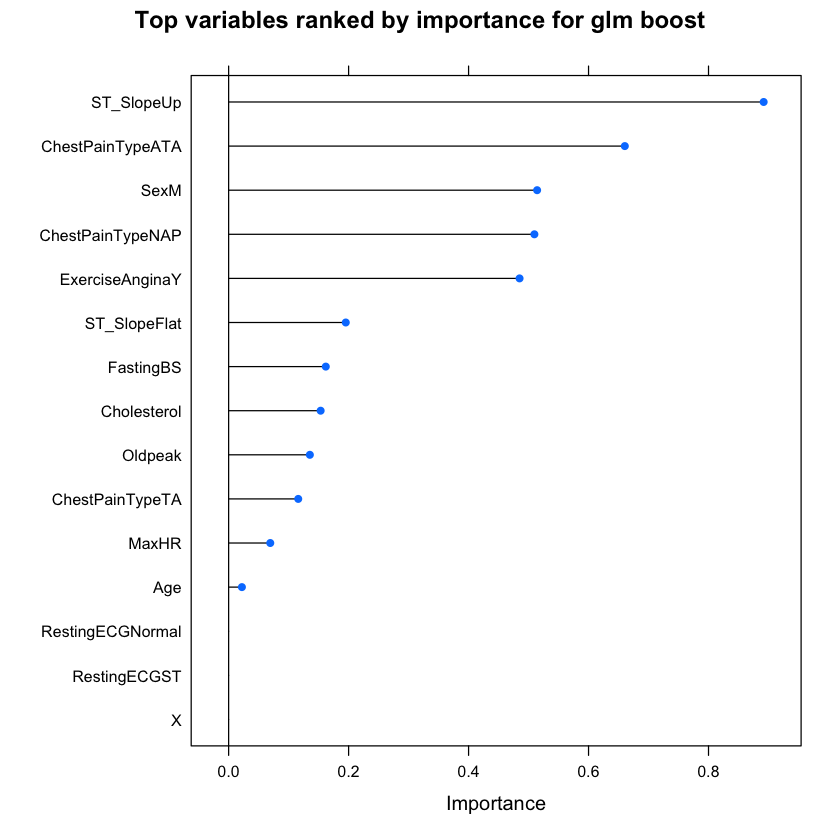

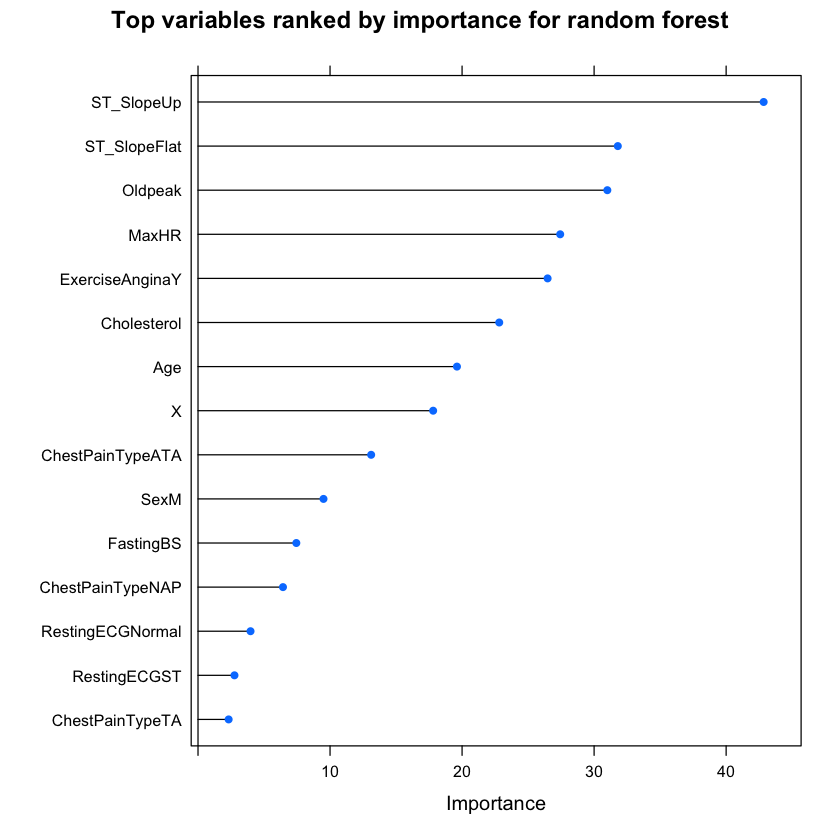

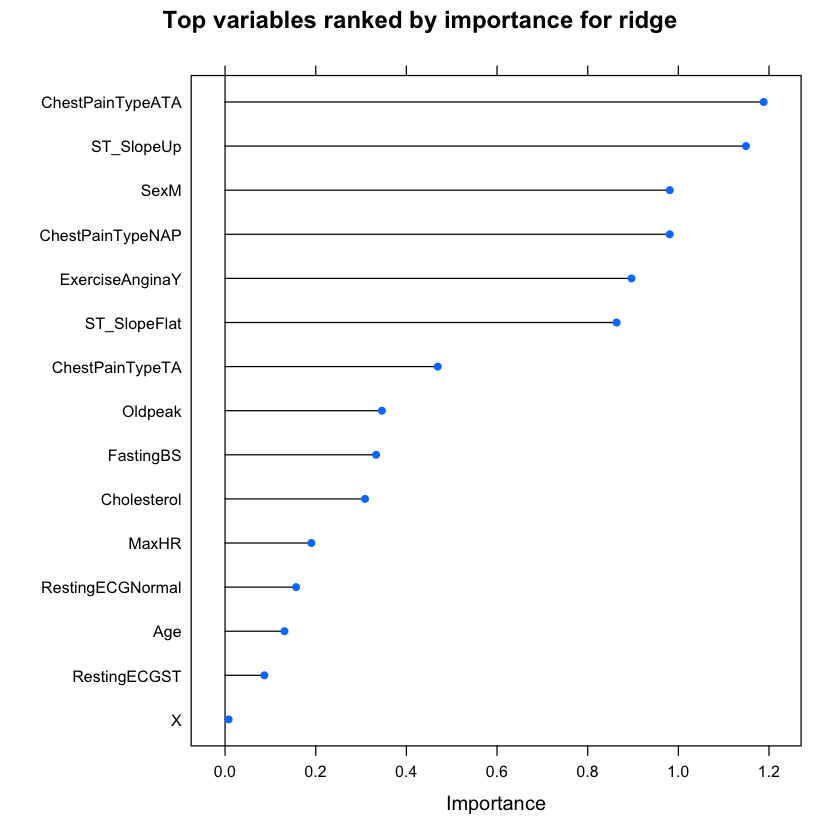

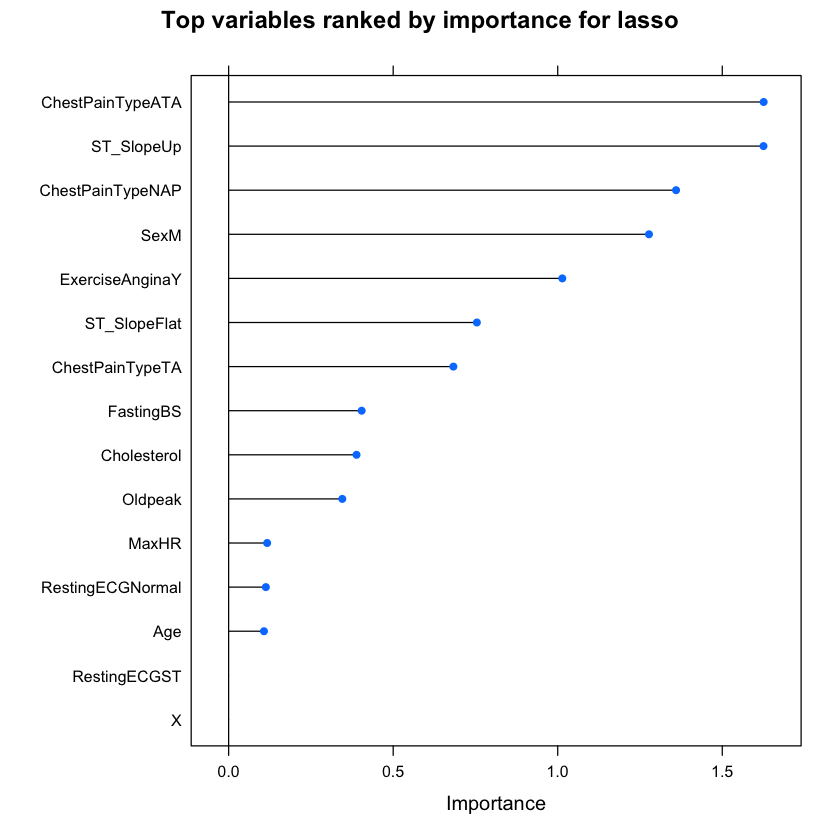

In [34]:
#Get variable importance for various models 
impGlmBoost <- varImp(res_glm_boost,scale = FALSE)
imprf <- varImp(res_rf,scale = FALSE)
impridge <- varImp(res_ridge, scale = FALSE)
implasso <- varImp(res_lasso, scale = FALSE)

plot(impGlmBoost, main = "Top variables ranked by importance for glm boost")
plot(imprf, main = "Top variables ranked by importance for random forest")
plot(impridge, main = "Top variables ranked by importance for ridge")
plot(implasso, main = "Top variables ranked by importance for lasso")

In [8]:
#Neural network 
nnetGrid <-  expand.grid(size = seq(from = 1, to = 10, by = 1), decay = c(0, 10^(-2), 10^(-3), 10^(-4)))

res_nn <- train(formula, data = trainSet, trControl = cv, method = "nnet", tuneGrid = nnetGrid)


Warning message in train.default(x, y, weights = w, ...):
“The metric "Accuracy" was not in the result set. ROC will be used instead.”


# weights:  18
initial  value 429.190302 
iter  10 value 213.435369
iter  20 value 190.923008
iter  30 value 190.125076
iter  40 value 181.869705
iter  50 value 181.021466
iter  60 value 180.935920
iter  70 value 180.881943
iter  80 value 180.817543
iter  90 value 180.804218
iter 100 value 180.784094
final  value 180.784094 
stopped after 100 iterations
# weights:  35
initial  value 410.011724 
iter  10 value 198.147366
iter  20 value 174.910815
iter  30 value 164.792717
iter  40 value 160.383276
iter  50 value 155.538166
iter  60 value 152.621603
iter  70 value 152.575614
iter  80 value 152.574645
final  value 152.574643 
converged
# weights:  52
initial  value 405.826254 
iter  10 value 186.341425
iter  20 value 162.891426
iter  30 value 138.950836
iter  40 value 129.648987
iter  50 value 122.665504
iter  60 value 119.774960
iter  70 value 118.243253
iter  80 value 117.825821
iter  90 value 117.703282
iter 100 value 117.596111
final  value 117.596111 
stopped after 100 iterations
# w

initial  value 394.892319 
iter  10 value 172.551928
iter  20 value 121.859970
iter  30 value 94.255752
iter  40 value 84.497827
iter  50 value 78.898577
iter  60 value 76.947004
iter  70 value 75.972032
iter  80 value 75.473149
iter  90 value 74.512388
iter 100 value 74.238219
final  value 74.238219 
stopped after 100 iterations
# weights:  120
initial  value 438.704693 
iter  10 value 183.756981
iter  20 value 141.768373
iter  30 value 104.257467
iter  40 value 78.015376
iter  50 value 72.284680
iter  60 value 66.513967
iter  70 value 63.600390
iter  80 value 62.977142
iter  90 value 62.649821
iter 100 value 62.295812
final  value 62.295812 
stopped after 100 iterations
# weights:  137
initial  value 482.449951 
iter  10 value 185.525987
iter  20 value 136.663709
iter  30 value 102.465186
iter  40 value 83.566173
iter  50 value 74.907913
iter  60 value 70.992277
iter  70 value 69.393506
iter  80 value 67.630930
iter  90 value 66.191309
iter 100 value 65.336924
final  value 65.336924 

initial  value 446.396101 
iter  10 value 165.241938
iter  20 value 110.795244
iter  30 value 66.680191
iter  40 value 36.422979
iter  50 value 28.328956
iter  60 value 24.491701
iter  70 value 22.174055
iter  80 value 19.842932
iter  90 value 19.146758
iter 100 value 19.071768
final  value 19.071768 
stopped after 100 iterations
# weights:  18
initial  value 400.571692 
iter  10 value 210.011355
iter  20 value 195.747094
iter  30 value 192.490214
iter  40 value 190.086453
iter  50 value 189.789888
iter  60 value 185.572157
iter  70 value 184.048233
iter  80 value 183.934228
iter  90 value 183.926714
final  value 183.918961 
converged
# weights:  35
initial  value 395.882356 
iter  10 value 193.755992
iter  20 value 173.034969
iter  30 value 166.506171
iter  40 value 165.307434
iter  50 value 165.191660
iter  60 value 165.083390
iter  70 value 165.082835
iter  70 value 165.082833
iter  70 value 165.082833
final  value 165.082833 
converged
# weights:  52
initial  value 433.586954 
iter

initial  value 414.435545 
iter  10 value 188.395445
iter  20 value 156.713359
iter  30 value 140.803049
iter  40 value 130.697864
iter  50 value 119.052964
iter  60 value 115.817093
iter  70 value 115.039245
iter  80 value 114.661809
iter  90 value 114.489402
iter 100 value 114.368387
final  value 114.368387 
stopped after 100 iterations
# weights:  86
initial  value 551.611321 
iter  10 value 195.578392
iter  20 value 148.703600
iter  30 value 126.918876
iter  40 value 117.064814
iter  50 value 107.279521
iter  60 value 104.681942
iter  70 value 103.917815
iter  80 value 103.661940
iter  90 value 103.005497
iter 100 value 102.642722
final  value 102.642722 
stopped after 100 iterations
# weights:  103
initial  value 497.217107 
iter  10 value 166.196379
iter  20 value 132.963271
iter  30 value 107.117058
iter  40 value 87.412054
iter  50 value 71.107094
iter  60 value 63.601816
iter  70 value 61.107347
iter  80 value 60.266208
iter  90 value 59.804181
iter 100 value 57.728821
final  

initial  value 390.742573 
iter  10 value 179.445537
iter  20 value 127.867887
iter  30 value 97.660670
iter  40 value 86.892538
iter  50 value 81.849790
iter  60 value 77.676061
iter  70 value 72.432691
iter  80 value 69.004864
iter  90 value 67.463642
iter 100 value 66.031025
final  value 66.031025 
stopped after 100 iterations
# weights:  171
initial  value 432.260548 
iter  10 value 194.019416
iter  20 value 133.910344
iter  30 value 95.502453
iter  40 value 74.798337
iter  50 value 66.971772
iter  60 value 62.864612
iter  70 value 59.515023
iter  80 value 56.255512
iter  90 value 54.643194
iter 100 value 53.719428
final  value 53.719428 
stopped after 100 iterations
# weights:  18
initial  value 399.686092 
iter  10 value 217.454584
iter  20 value 197.808464
iter  30 value 194.420704
iter  40 value 192.891295
iter  50 value 191.644729
iter  60 value 190.288035
iter  70 value 190.029066
iter  80 value 190.016513
iter  90 value 190.013921
final  value 190.012454 
converged
# weights

initial  value 416.593149 
iter  10 value 182.392556
iter  20 value 154.484953
iter  30 value 148.454141
iter  40 value 130.259936
iter  50 value 123.000763
iter  60 value 122.404362
iter  70 value 122.058850
iter  80 value 121.886215
iter  90 value 121.805038
iter 100 value 121.711235
final  value 121.711235 
stopped after 100 iterations
# weights:  69
initial  value 408.089558 
iter  10 value 179.054269
iter  20 value 135.773482
iter  30 value 111.060526
iter  40 value 98.867320
iter  50 value 85.281559
iter  60 value 78.409434
iter  70 value 77.150180
iter  80 value 77.107955
iter  90 value 77.082142
iter 100 value 76.938759
final  value 76.938759 
stopped after 100 iterations
# weights:  86
initial  value 425.000113 
iter  10 value 171.150210
iter  20 value 134.757782
iter  30 value 107.032062
iter  40 value 94.569883
iter  50 value 90.075572
iter  60 value 85.545745
iter  70 value 80.004925
iter  80 value 78.674242
iter  90 value 78.534601
iter 100 value 78.530056
final  value 78.

initial  value 389.025752 
iter  10 value 180.235240
iter  20 value 125.500672
iter  30 value 92.717226
iter  40 value 71.947374
iter  50 value 61.016330
iter  60 value 54.273851
iter  70 value 50.706519
iter  80 value 47.930799
iter  90 value 41.918591
iter 100 value 39.458261
final  value 39.458261 
stopped after 100 iterations
# weights:  154
initial  value 442.599956 
iter  10 value 164.376289
iter  20 value 103.863853
iter  30 value 64.920587
iter  40 value 51.056863
iter  50 value 47.437756
iter  60 value 45.378095
iter  70 value 44.305998
iter  80 value 43.035512
iter  90 value 41.646014
iter 100 value 40.426967
final  value 40.426967 
stopped after 100 iterations
# weights:  171
initial  value 504.092823 
iter  10 value 166.074666
iter  20 value 112.486900
iter  30 value 59.831199
iter  40 value 47.927695
iter  50 value 42.740529
iter  60 value 38.323227
iter  70 value 35.133480
iter  80 value 30.669865
iter  90 value 27.748679
iter 100 value 24.740250
final  value 24.740250 
s

initial  value 401.278761 
iter  10 value 239.317352
iter  20 value 199.973821
iter  30 value 189.941240
iter  40 value 173.381838
iter  50 value 165.459249
iter  60 value 161.526933
iter  70 value 160.315435
iter  80 value 160.282092
iter  90 value 160.275057
iter 100 value 160.273276
final  value 160.273276 
stopped after 100 iterations
# weights:  52
initial  value 400.022659 
iter  10 value 199.715507
iter  20 value 157.747518
iter  30 value 153.359361
iter  40 value 145.672344
iter  50 value 143.525347
iter  60 value 143.222934
iter  70 value 143.019569
iter  80 value 143.009595
iter  90 value 143.001487
iter 100 value 142.998915
final  value 142.998915 
stopped after 100 iterations
# weights:  69
initial  value 383.223948 
iter  10 value 184.697618
iter  20 value 155.431403
iter  30 value 140.620211
iter  40 value 128.497604
iter  50 value 126.525378
iter  60 value 125.045251
iter  70 value 124.634375
iter  80 value 124.590749
iter  90 value 124.561284
iter 100 value 124.554381
f

initial  value 398.970800 
iter  10 value 178.986425
iter  20 value 130.794700
iter  30 value 99.104049
iter  40 value 87.712671
iter  50 value 77.326886
iter  60 value 73.663014
iter  70 value 73.206588
iter  80 value 72.716902
iter  90 value 71.962259
iter 100 value 71.812393
final  value 71.812393 
stopped after 100 iterations
# weights:  120
initial  value 405.962064 
iter  10 value 180.078468
iter  20 value 131.077721
iter  30 value 95.986499
iter  40 value 73.430887
iter  50 value 65.117911
iter  60 value 58.798899
iter  70 value 55.701700
iter  80 value 55.220836
iter  90 value 54.804619
iter 100 value 54.545745
final  value 54.545745 
stopped after 100 iterations
# weights:  137
initial  value 414.857003 
iter  10 value 180.432783
iter  20 value 132.430917
iter  30 value 90.641995
iter  40 value 65.960623
iter  50 value 57.258493
iter  60 value 54.431506
iter  70 value 53.167504
iter  80 value 52.372222
iter  90 value 51.772507
iter 100 value 51.189199
final  value 51.189199 
s

initial  value 458.440786 
iter  10 value 173.917273
iter  20 value 122.552127
iter  30 value 83.301416
iter  40 value 67.966580
iter  50 value 61.708453
iter  60 value 58.760927
iter  70 value 56.271436
iter  80 value 51.733779
iter  90 value 49.089629
iter 100 value 47.947871
final  value 47.947871 
stopped after 100 iterations
# weights:  18
initial  value 403.780411 
iter  10 value 215.013054
iter  20 value 186.333015
iter  30 value 185.582726
iter  40 value 184.722559
iter  50 value 184.614781
iter  60 value 184.499212
final  value 184.487665 
converged
# weights:  35
initial  value 400.572496 
iter  10 value 209.940288
iter  20 value 178.641856
iter  30 value 173.932215
iter  40 value 168.627914
iter  50 value 167.696748
iter  60 value 167.483484
iter  70 value 167.277867
iter  80 value 167.227641
iter  90 value 167.211658
iter 100 value 167.199381
final  value 167.199381 
stopped after 100 iterations
# weights:  52
initial  value 505.897645 
iter  10 value 202.299359
iter  20 va

initial  value 454.475713 
iter  10 value 209.811543
iter  20 value 168.151432
iter  30 value 149.954641
iter  40 value 138.363690
iter  50 value 127.671493
iter  60 value 119.656005
iter  70 value 118.278158
iter  80 value 118.243360
final  value 118.243259 
converged
# weights:  86
initial  value 502.009458 
iter  10 value 195.974369
iter  20 value 155.575312
iter  30 value 139.229883
iter  40 value 128.128210
iter  50 value 119.763355
iter  60 value 114.918131
iter  70 value 111.984897
iter  80 value 111.125677
iter  90 value 110.981135
iter 100 value 110.817208
final  value 110.817208 
stopped after 100 iterations
# weights:  103
initial  value 483.182512 
iter  10 value 185.201680
iter  20 value 146.399234
iter  30 value 110.313843
iter  40 value 94.510047
iter  50 value 87.606420
iter  60 value 86.471619
iter  70 value 85.745122
iter  80 value 85.401091
iter  90 value 84.966750
iter 100 value 84.281098
final  value 84.281098 
stopped after 100 iterations
# weights:  120
initial  

initial  value 480.915258 
iter  10 value 189.117656
iter  20 value 142.301113
iter  30 value 79.174635
iter  40 value 59.811977
iter  50 value 53.808539
iter  60 value 49.380544
iter  70 value 46.119078
iter  80 value 43.779667
iter  90 value 40.070447
iter 100 value 39.051924
final  value 39.051924 
stopped after 100 iterations
# weights:  171
initial  value 529.862718 
iter  10 value 186.128203
iter  20 value 126.944798
iter  30 value 71.035124
iter  40 value 54.850437
iter  50 value 47.203489
iter  60 value 44.259822
iter  70 value 42.291665
iter  80 value 40.917138
iter  90 value 39.169938
iter 100 value 35.614723
final  value 35.614723 
stopped after 100 iterations
# weights:  18
initial  value 431.490432 
iter  10 value 218.477851
iter  20 value 199.590609
iter  30 value 196.881811
iter  40 value 196.567957
iter  50 value 196.333365
iter  60 value 194.626671
iter  70 value 193.778141
iter  80 value 193.767046
iter  90 value 193.766008
iter 100 value 193.765378
final  value 193.7

initial  value 423.782863 
iter  10 value 179.364574
iter  20 value 141.807000
iter  30 value 128.272855
iter  40 value 123.345380
iter  50 value 122.066355
iter  60 value 121.316462
iter  70 value 121.025262
iter  80 value 120.145752
iter  90 value 119.639556
iter 100 value 119.583356
final  value 119.583356 
stopped after 100 iterations
# weights:  86
initial  value 573.690727 
iter  10 value 166.481004
iter  20 value 134.017641
iter  30 value 120.360959
iter  40 value 115.662083
iter  50 value 113.653511
iter  60 value 112.397788
iter  70 value 111.163198
iter  80 value 109.852309
iter  90 value 108.820667
iter 100 value 108.649471
final  value 108.649471 
stopped after 100 iterations
# weights:  103
initial  value 458.839048 
iter  10 value 172.585519
iter  20 value 137.032452
iter  30 value 112.811963
iter  40 value 106.202156
iter  50 value 102.070950
iter  60 value 100.367404
iter  70 value 96.454196
iter  80 value 90.910033
iter  90 value 88.962704
iter 100 value 85.622097
fina

initial  value 441.527192 
iter  10 value 163.919625
iter  20 value 125.382345
iter  30 value 86.308244
iter  40 value 53.887140
iter  50 value 43.879631
iter  60 value 39.503431
iter  70 value 35.523327
iter  80 value 33.152780
iter  90 value 31.947394
iter 100 value 31.484344
final  value 31.484344 
stopped after 100 iterations
# weights:  154
initial  value 429.805482 
iter  10 value 162.608922
iter  20 value 111.137218
iter  30 value 80.533626
iter  40 value 60.236028
iter  50 value 45.727797
iter  60 value 40.347260
iter  70 value 38.098891
iter  80 value 37.374183
iter  90 value 36.950015
iter 100 value 36.747297
final  value 36.747297 
stopped after 100 iterations
# weights:  171
initial  value 429.162160 
iter  10 value 166.843667
iter  20 value 114.818013
iter  30 value 76.391274
iter  40 value 49.242251
iter  50 value 38.080775
iter  60 value 36.303305
iter  70 value 33.751309
iter  80 value 33.105094
iter  90 value 32.521641
iter 100 value 31.460207
final  value 31.460207 
s

initial  value 387.638861 
iter  10 value 186.989618
iter  20 value 157.624048
iter  30 value 145.445727
iter  40 value 139.081552
iter  50 value 137.528719
iter  60 value 137.328757
iter  70 value 137.227198
iter  80 value 137.186284
iter  90 value 137.174965
iter 100 value 137.169317
final  value 137.169317 
stopped after 100 iterations
# weights:  69
initial  value 393.221614 
iter  10 value 171.614676
iter  20 value 135.995185
iter  30 value 122.069470
iter  40 value 116.946503
iter  50 value 115.243603
iter  60 value 114.151024
iter  70 value 113.921479
iter  80 value 113.826969
iter  90 value 113.775246
iter 100 value 113.706775
final  value 113.706775 
stopped after 100 iterations
# weights:  86
initial  value 475.255285 
iter  10 value 182.360876
iter  20 value 134.045065
iter  30 value 111.163839
iter  40 value 101.151361
iter  50 value 99.465735
iter  60 value 98.458929
iter  70 value 97.866342
iter  80 value 97.463272
iter  90 value 96.953355
iter 100 value 96.346769
final  

initial  value 478.967570 
iter  10 value 191.668892
iter  20 value 152.071206
iter  30 value 105.027813
iter  40 value 75.477038
iter  50 value 58.533757
iter  60 value 50.593642
iter  70 value 46.388283
iter  80 value 43.425403
iter  90 value 40.612629
iter 100 value 39.017193
final  value 39.017193 
stopped after 100 iterations
# weights:  154
initial  value 410.064088 
iter  10 value 173.274410
iter  20 value 121.300301
iter  30 value 70.410794
iter  40 value 45.132541
iter  50 value 34.516998
iter  60 value 27.747807
iter  70 value 25.972034
iter  80 value 24.761985
iter  90 value 24.082789
iter 100 value 23.947399
final  value 23.947399 
stopped after 100 iterations
# weights:  171
initial  value 462.601522 
iter  10 value 203.394791
iter  20 value 137.103396
iter  30 value 85.071498
iter  40 value 38.990820
iter  50 value 17.801425
iter  60 value 12.440520
iter  70 value 10.317883
iter  80 value 9.964215
iter  90 value 9.787255
iter 100 value 9.335858
final  value 9.335858 
stop

initial  value 399.607541 
iter  10 value 195.389497
iter  20 value 167.405875
iter  30 value 158.753985
iter  40 value 149.008385
iter  50 value 141.875662
iter  60 value 140.927888
iter  70 value 140.450047
iter  80 value 140.285779
iter  90 value 140.211963
iter 100 value 140.154874
final  value 140.154874 
stopped after 100 iterations
# weights:  69
initial  value 434.121194 
iter  10 value 190.081946
iter  20 value 172.417581
iter  30 value 155.878681
iter  40 value 137.060911
iter  50 value 129.235359
iter  60 value 127.410937
iter  70 value 125.116330
iter  80 value 121.502105
iter  90 value 119.761914
iter 100 value 118.305119
final  value 118.305119 
stopped after 100 iterations
# weights:  86
initial  value 405.351884 
iter  10 value 173.208881
iter  20 value 129.010485
iter  30 value 104.310363
iter  40 value 94.090894
iter  50 value 89.360066
iter  60 value 86.094535
iter  70 value 82.866693
iter  80 value 82.466727
iter  90 value 82.380304
iter 100 value 82.327148
final  v

initial  value 440.666134 
iter  10 value 174.625112
iter  20 value 134.152671
iter  30 value 101.176053
iter  40 value 88.060652
iter  50 value 84.332224
iter  60 value 82.834428
iter  70 value 80.105366
iter  80 value 75.617060
iter  90 value 71.240208
iter 100 value 68.315627
final  value 68.315627 
stopped after 100 iterations
# weights:  137
initial  value 449.511850 
iter  10 value 173.343859
iter  20 value 126.906301
iter  30 value 100.896733
iter  40 value 92.006668
iter  50 value 87.535482
iter  60 value 84.162361
iter  70 value 79.700857
iter  80 value 71.715325
iter  90 value 65.974539
iter 100 value 63.185186
final  value 63.185186 
stopped after 100 iterations
# weights:  154
initial  value 394.338423 
iter  10 value 168.737229
iter  20 value 118.450320
iter  30 value 84.494905
iter  40 value 68.255041
iter  50 value 62.038658
iter  60 value 55.975957
iter  70 value 52.195577
iter  80 value 48.481320
iter  90 value 46.580160
iter 100 value 45.640758
final  value 45.640758 

initial  value 396.539562 
iter  10 value 224.109484
iter  20 value 191.133443
iter  30 value 190.270371
iter  40 value 190.138258
iter  50 value 190.137291
iter  60 value 190.123255
iter  70 value 190.113554
final  value 190.113531 
converged
# weights:  35
initial  value 392.089951 
iter  10 value 197.851702
iter  20 value 178.631705
iter  30 value 169.927455
iter  40 value 160.199646
iter  50 value 151.946071
iter  60 value 151.029352
iter  70 value 151.019074
final  value 151.019042 
converged
# weights:  52
initial  value 395.714144 
iter  10 value 195.851115
iter  20 value 168.815084
iter  30 value 160.526525
iter  40 value 142.572001
iter  50 value 132.112547
iter  60 value 130.167798
iter  70 value 129.925471
iter  80 value 129.864482
iter  90 value 129.703116
iter 100 value 129.693545
final  value 129.693545 
stopped after 100 iterations
# weights:  69
initial  value 465.032647 
iter  10 value 180.680299
iter  20 value 150.444326
iter  30 value 139.525733
iter  40 value 133.67

initial  value 430.097116 
iter  10 value 179.099070
iter  20 value 142.691099
iter  30 value 116.540821
iter  40 value 104.513920
iter  50 value 97.612989
iter  60 value 95.851567
iter  70 value 93.844429
iter  80 value 93.153266
iter  90 value 92.289337
iter 100 value 91.603718
final  value 91.603718 
stopped after 100 iterations
# weights:  120
initial  value 395.287092 
iter  10 value 183.963528
iter  20 value 123.450847
iter  30 value 91.457363
iter  40 value 77.378816
iter  50 value 73.372034
iter  60 value 71.824747
iter  70 value 70.188243
iter  80 value 69.258576
iter  90 value 68.040212
iter 100 value 67.322787
final  value 67.322787 
stopped after 100 iterations
# weights:  137
initial  value 438.767835 
iter  10 value 198.502116
iter  20 value 153.268539
iter  30 value 103.621739
iter  40 value 75.386903
iter  50 value 63.417243
iter  60 value 54.690704
iter  70 value 51.258546
iter  80 value 49.073893
iter  90 value 45.165614
iter 100 value 42.623003
final  value 42.623003

initial  value 356.902089 
iter  10 value 161.499858
iter  20 value 106.220665
iter  30 value 60.955803
iter  40 value 42.717970
iter  50 value 36.380177
iter  60 value 35.057834
iter  70 value 33.062845
iter  80 value 32.486553
iter  90 value 32.272174
iter 100 value 32.059235
final  value 32.059235 
stopped after 100 iterations
# weights:  18
initial  value 426.871135 
iter  10 value 205.526873
iter  20 value 182.456684
iter  30 value 181.717212
iter  40 value 176.294702
iter  50 value 173.394010
iter  60 value 172.530016
final  value 172.488579 
converged
# weights:  35
initial  value 399.063132 
iter  10 value 204.180538
iter  20 value 175.501670
iter  30 value 166.811549
iter  40 value 158.406439
iter  50 value 157.432858
iter  60 value 157.051048
iter  70 value 156.892345
iter  80 value 156.886772
iter  90 value 156.884495
iter 100 value 156.882034
final  value 156.882034 
stopped after 100 iterations
# weights:  52
initial  value 384.636271 
iter  10 value 184.305754
iter  20 va

initial  value 396.256059 
iter  10 value 155.697720
iter  20 value 122.577964
iter  30 value 103.664619
iter  40 value 85.308970
iter  50 value 79.047566
iter  60 value 74.609518
iter  70 value 72.364306
iter  80 value 71.495841
iter  90 value 70.850691
iter 100 value 70.589628
final  value 70.589628 
stopped after 100 iterations
# weights:  103
initial  value 376.963647 
iter  10 value 162.132503
iter  20 value 122.269498
iter  30 value 94.165694
iter  40 value 73.047180
iter  50 value 65.862893
iter  60 value 62.035014
iter  70 value 59.091707
iter  80 value 57.168105
iter  90 value 56.590096
iter 100 value 56.345363
final  value 56.345363 
stopped after 100 iterations
# weights:  120
initial  value 450.273527 
iter  10 value 155.374459
iter  20 value 111.266568
iter  30 value 75.096631
iter  40 value 64.037779
iter  50 value 61.143746
iter  60 value 58.600974
iter  70 value 56.184207
iter  80 value 55.105234
iter  90 value 54.840391
iter 100 value 54.715707
final  value 54.715707 


initial  value 511.219048 
iter  10 value 162.069737
iter  20 value 121.537385
iter  30 value 90.370788
iter  40 value 64.387186
iter  50 value 51.149857
iter  60 value 45.269198
iter  70 value 41.922101
iter  80 value 39.774311
iter  90 value 38.575962
iter 100 value 37.729546
final  value 37.729546 
stopped after 100 iterations
# weights:  18
initial  value 449.169022 
iter  10 value 210.874145
iter  20 value 181.441159
iter  30 value 180.239301
iter  40 value 177.305836
iter  50 value 177.127963
iter  60 value 177.121625
iter  70 value 177.119921
final  value 177.119913 
converged
# weights:  35
initial  value 400.780780 
iter  10 value 177.175808
iter  20 value 158.074824
iter  30 value 152.412847
iter  40 value 148.731711
iter  50 value 148.599058
iter  60 value 148.595925
iter  70 value 148.594500
iter  80 value 148.593520
iter  90 value 148.593348
iter 100 value 148.593307
final  value 148.593307 
stopped after 100 iterations
# weights:  52
initial  value 482.209584 
iter  10 va

initial  value 432.272484 
iter  10 value 213.988507
iter  20 value 166.422752
iter  30 value 153.794299
iter  40 value 139.888343
iter  50 value 123.299438
iter  60 value 112.516951
iter  70 value 108.807635
iter  80 value 107.552111
iter  90 value 107.055000
iter 100 value 106.842177
final  value 106.842177 
stopped after 100 iterations
# weights:  86
initial  value 498.741958 
iter  10 value 173.487115
iter  20 value 128.243132
iter  30 value 102.589668
iter  40 value 93.106413
iter  50 value 84.306528
iter  60 value 76.917114
iter  70 value 76.388489
iter  80 value 76.326416
iter  90 value 76.324696
iter 100 value 76.324573
final  value 76.324573 
stopped after 100 iterations
# weights:  103
initial  value 416.055321 
iter  10 value 181.109294
iter  20 value 134.364535
iter  30 value 99.750992
iter  40 value 84.614574
iter  50 value 73.481952
iter  60 value 69.236178
iter  70 value 66.708575
iter  80 value 65.636496
iter  90 value 65.183830
iter 100 value 65.074119
final  value 65.

initial  value 427.670559 
iter  10 value 201.800422
iter  20 value 138.408026
iter  30 value 101.398496
iter  40 value 84.482141
iter  50 value 76.946126
iter  60 value 74.458053
iter  70 value 73.768513
iter  80 value 73.268909
iter  90 value 72.099747
iter 100 value 71.638281
final  value 71.638281 
stopped after 100 iterations
# weights:  154
initial  value 534.531503 
iter  10 value 176.074858
iter  20 value 122.730740
iter  30 value 76.773113
iter  40 value 44.502096
iter  50 value 29.867201
iter  60 value 27.718723
iter  70 value 26.497591
iter  80 value 25.874288
iter  90 value 24.804666
iter 100 value 22.769230
final  value 22.769230 
stopped after 100 iterations
# weights:  171
initial  value 457.631452 
iter  10 value 172.281577
iter  20 value 120.365023
iter  30 value 57.536490
iter  40 value 35.783600
iter  50 value 28.434272
iter  60 value 25.643091
iter  70 value 24.019367
iter  80 value 22.967721
iter  90 value 21.763154
iter 100 value 20.536061
final  value 20.536061 


initial  value 396.859980 
iter  10 value 182.219337
iter  20 value 171.338308
iter  30 value 166.412722
iter  40 value 164.484713
iter  50 value 163.298675
iter  60 value 162.891132
iter  70 value 161.003516
iter  80 value 154.795992
iter  90 value 150.434974
iter 100 value 148.059778
final  value 148.059778 
stopped after 100 iterations
# weights:  69
initial  value 414.150165 
iter  10 value 182.760055
iter  20 value 159.817970
iter  30 value 135.705196
iter  40 value 122.605527
iter  50 value 120.468465
iter  60 value 119.970362
iter  70 value 119.790730
iter  80 value 119.658504
iter  90 value 119.615839
iter 100 value 119.600329
final  value 119.600329 
stopped after 100 iterations
# weights:  86
initial  value 390.018739 
iter  10 value 178.930262
iter  20 value 152.028401
iter  30 value 128.927734
iter  40 value 122.707856
iter  50 value 119.242791
iter  60 value 118.159134
iter  70 value 117.867308
iter  80 value 117.726872
iter  90 value 117.619032
iter 100 value 117.611372
f

initial  value 535.516375 
iter  10 value 172.895419
iter  20 value 140.202966
iter  30 value 103.437458
iter  40 value 77.015797
iter  50 value 72.212577
iter  60 value 67.719076
iter  70 value 63.812080
iter  80 value 61.205527
iter  90 value 59.927121
iter 100 value 59.206868
final  value 59.206868 
stopped after 100 iterations
# weights:  154
initial  value 447.346734 
iter  10 value 182.079927
iter  20 value 138.717944
iter  30 value 87.810233
iter  40 value 53.112658
iter  50 value 46.129333
iter  60 value 43.466959
iter  70 value 40.467180
iter  80 value 39.318070
iter  90 value 38.257076
iter 100 value 37.341425
final  value 37.341425 
stopped after 100 iterations
# weights:  171
initial  value 476.521454 
iter  10 value 182.118422
iter  20 value 132.871627
iter  30 value 76.938460
iter  40 value 51.955553
iter  50 value 46.326957
iter  60 value 43.724126
iter  70 value 40.743678
iter  80 value 35.680701
iter  90 value 34.538980
iter 100 value 34.148531
final  value 34.148531 


initial  value 400.197233 
iter  10 value 202.728206
iter  20 value 171.225798
iter  30 value 162.682873
iter  40 value 158.790789
iter  50 value 156.415249
iter  60 value 154.761212
iter  70 value 153.560453
iter  80 value 152.510310
iter  90 value 152.092838
iter 100 value 151.807591
final  value 151.807591 
stopped after 100 iterations
# weights:  69
initial  value 403.291547 
iter  10 value 201.682068
iter  20 value 168.368362
iter  30 value 150.010363
iter  40 value 135.463281
iter  50 value 125.687023
iter  60 value 123.134092
iter  70 value 120.527875
iter  80 value 119.447132
iter  90 value 118.796223
iter 100 value 117.928131
final  value 117.928131 
stopped after 100 iterations
# weights:  86
initial  value 411.663367 
iter  10 value 186.855046
iter  20 value 158.208449
iter  30 value 129.984595
iter  40 value 110.673604
iter  50 value 98.095925
iter  60 value 87.466371
iter  70 value 82.415563
iter  80 value 80.455367
iter  90 value 77.825616
iter 100 value 76.856858
final  

initial  value 436.690460 
iter  10 value 183.457603
iter  20 value 128.838883
iter  30 value 98.013521
iter  40 value 87.193842
iter  50 value 82.392276
iter  60 value 76.558246
iter  70 value 74.749874
iter  80 value 73.900281
iter  90 value 73.804910
iter 100 value 73.774930
final  value 73.774930 
stopped after 100 iterations
# weights:  137
initial  value 422.035622 
iter  10 value 183.232057
iter  20 value 129.919419
iter  30 value 79.113133
iter  40 value 54.868291
iter  50 value 42.852720
iter  60 value 41.665919
iter  70 value 41.140792
iter  80 value 40.994973
iter  90 value 40.783949
iter 100 value 40.714805
final  value 40.714805 
stopped after 100 iterations
# weights:  154
initial  value 390.307846 
iter  10 value 174.504378
iter  20 value 123.538454
iter  30 value 73.838153
iter  40 value 40.790816
iter  50 value 26.545604
iter  60 value 24.373734
iter  70 value 23.357981
iter  80 value 23.130092
iter  90 value 23.076719
iter 100 value 23.059286
final  value 23.059286 
s

initial  value 405.040014 
iter  10 value 201.084591
iter  20 value 194.842432
iter  30 value 193.644635
iter  40 value 191.646606
iter  50 value 191.072421
iter  60 value 190.608701
iter  70 value 190.401901
iter  80 value 190.372040
iter  90 value 190.370870
iter 100 value 190.364137
final  value 190.364137 
stopped after 100 iterations
# weights:  35
initial  value 440.498388 
iter  10 value 192.472812
iter  20 value 170.131406
iter  30 value 164.951606
iter  40 value 160.772811
iter  50 value 153.811219
iter  60 value 151.653296
iter  70 value 151.448936
iter  80 value 151.347196
iter  90 value 151.289756
iter 100 value 151.259873
final  value 151.259873 
stopped after 100 iterations
# weights:  52
initial  value 400.298573 
iter  10 value 190.498493
iter  20 value 162.217628
iter  30 value 155.326567
iter  40 value 147.327417
iter  50 value 143.870543
iter  60 value 140.606493
iter  70 value 139.966080
iter  80 value 139.427587
iter  90 value 139.072415
iter 100 value 138.860461
f

initial  value 424.730725 
iter  10 value 189.197919
iter  20 value 142.206120
iter  30 value 112.426121
iter  40 value 97.195265
iter  50 value 90.234088
iter  60 value 87.987731
iter  70 value 85.748949
iter  80 value 81.636261
iter  90 value 80.770670
iter 100 value 80.343941
final  value 80.343941 
stopped after 100 iterations
# weights:  120
initial  value 414.097520 
iter  10 value 192.977236
iter  20 value 166.524766
iter  30 value 130.857219
iter  40 value 103.712139
iter  50 value 97.683194
iter  60 value 93.278341
iter  70 value 91.982607
iter  80 value 90.214070
iter  90 value 87.555921
iter 100 value 83.969192
final  value 83.969192 
stopped after 100 iterations
# weights:  137
initial  value 409.273167 
iter  10 value 180.590202
iter  20 value 143.687169
iter  30 value 113.328118
iter  40 value 95.141910
iter  50 value 87.890679
iter  60 value 84.716692
iter  70 value 81.868207
iter  80 value 78.403407
iter  90 value 77.440375
iter 100 value 77.000432
final  value 77.00043

initial  value 403.665154 
iter  10 value 182.651268
iter  20 value 147.378169
iter  30 value 74.025288
iter  40 value 45.805304
iter  50 value 40.781631
iter  60 value 37.716887
iter  70 value 37.065136
iter  80 value 36.711572
iter  90 value 35.601140
iter 100 value 32.568330
final  value 32.568330 
stopped after 100 iterations
# weights:  18
initial  value 400.145310 
iter  10 value 206.006240
iter  20 value 196.470942
iter  30 value 193.734329
iter  40 value 192.857458
iter  50 value 192.818356
iter  60 value 192.659872
iter  70 value 192.531978
iter  80 value 192.505330
iter  90 value 192.503768
iter 100 value 192.499846
final  value 192.499846 
stopped after 100 iterations
# weights:  35
initial  value 469.324083 
iter  10 value 206.853242
iter  20 value 195.500624
iter  30 value 186.256247
iter  40 value 178.786593
iter  50 value 174.966126
iter  60 value 172.250925
iter  70 value 170.405537
iter  80 value 170.059979
iter  90 value 169.939105
iter 100 value 169.691782
final  val

initial  value 409.194988 
iter  10 value 192.394051
iter  20 value 161.802463
iter  30 value 133.129328
iter  40 value 121.389939
iter  50 value 117.626655
iter  60 value 115.491639
iter  70 value 114.255986
iter  80 value 113.908177
iter  90 value 113.757581
iter 100 value 113.539962
final  value 113.539962 
stopped after 100 iterations
# weights:  86
initial  value 409.181878 
iter  10 value 187.288430
iter  20 value 154.506033
iter  30 value 139.042493
iter  40 value 129.122796
iter  50 value 124.444059
iter  60 value 122.690537
iter  70 value 122.296522
iter  80 value 122.084362
iter  90 value 122.010151
iter 100 value 121.984816
final  value 121.984816 
stopped after 100 iterations
# weights:  103
initial  value 448.076824 
iter  10 value 187.973645
iter  20 value 154.453819
iter  30 value 127.239346
iter  40 value 99.996418
iter  50 value 90.409990
iter  60 value 82.905525
iter  70 value 80.531245
iter  80 value 78.943734
iter  90 value 77.582457
iter 100 value 76.319249
final  

initial  value 453.941336 
iter  10 value 172.282426
iter  20 value 120.971690
iter  30 value 73.664639
iter  40 value 36.557331
iter  50 value 25.014053
iter  60 value 20.716815
iter  70 value 19.063226
iter  80 value 18.935541
iter  90 value 18.916599
iter 100 value 18.908126
final  value 18.908126 
stopped after 100 iterations
# weights:  154
initial  value 420.813757 
iter  10 value 166.062283
iter  20 value 108.741872
iter  30 value 62.572494
iter  40 value 42.317513
iter  50 value 35.364741
iter  60 value 33.409491
iter  70 value 32.539291
iter  80 value 31.683521
iter  90 value 30.954181
iter 100 value 30.584275
final  value 30.584275 
stopped after 100 iterations
# weights:  171
initial  value 423.579480 
iter  10 value 174.429957
iter  20 value 120.129515
iter  30 value 70.212084
iter  40 value 44.259983
iter  50 value 26.425825
iter  60 value 19.730190
iter  70 value 16.276370
iter  80 value 14.744351
iter  90 value 14.614887
iter 100 value 14.563624
final  value 14.563624 
s

initial  value 406.247211 
iter  10 value 195.995643
iter  20 value 155.739483
iter  30 value 144.782988
iter  40 value 139.532352
iter  50 value 134.811051
iter  60 value 134.316560
iter  70 value 134.203164
iter  80 value 134.104582
iter  90 value 134.048876
iter 100 value 133.970115
final  value 133.970115 
stopped after 100 iterations
# weights:  69
initial  value 404.873210 
iter  10 value 195.289201
iter  20 value 152.752982
iter  30 value 136.543734
iter  40 value 124.081971
iter  50 value 118.384970
iter  60 value 116.941267
iter  70 value 116.419533
iter  80 value 115.442325
iter  90 value 115.298823
iter 100 value 115.235586
final  value 115.235586 
stopped after 100 iterations
# weights:  86
initial  value 393.529271 
iter  10 value 181.811210
iter  20 value 133.223415
iter  30 value 120.143478
iter  40 value 110.516557
iter  50 value 103.426297
iter  60 value 100.495309
iter  70 value 98.168951
iter  80 value 97.951468
iter  90 value 97.614779
iter 100 value 97.387637
final

initial  value 433.255365 
iter  10 value 165.842738
iter  20 value 118.349968
iter  30 value 90.614934
iter  40 value 78.470510
iter  50 value 71.853871
iter  60 value 66.640675
iter  70 value 62.632365
iter  80 value 58.261423
iter  90 value 56.182679
iter 100 value 53.074498
final  value 53.074498 
stopped after 100 iterations
# weights:  154
initial  value 523.201821 
iter  10 value 152.023690
iter  20 value 117.943732
iter  30 value 81.236530
iter  40 value 67.130235
iter  50 value 63.358762
iter  60 value 60.200202
iter  70 value 57.572431
iter  80 value 52.820984
iter  90 value 50.683028
iter 100 value 49.614565
final  value 49.614565 
stopped after 100 iterations
# weights:  171
initial  value 420.223068 
iter  10 value 168.789132
iter  20 value 127.601544
iter  30 value 98.463580
iter  40 value 83.538708
iter  50 value 76.338618
iter  60 value 70.439495
iter  70 value 58.900478
iter  80 value 51.935836
iter  90 value 48.011099
iter 100 value 44.938452
final  value 44.938452 
s

initial  value 401.711413 
iter  10 value 183.069804
iter  20 value 148.804883
iter  30 value 139.277686
iter  40 value 130.286949
iter  50 value 123.395325
iter  60 value 121.196482
iter  70 value 121.054579
iter  80 value 121.050834
final  value 121.050830 
converged
# weights:  69
initial  value 485.096520 
iter  10 value 176.944139
iter  20 value 144.722747
iter  30 value 129.432546
iter  40 value 123.060964
iter  50 value 114.735928
iter  60 value 105.637985
iter  70 value 104.871948
iter  80 value 104.738475
iter  90 value 104.698821
iter 100 value 104.679893
final  value 104.679893 
stopped after 100 iterations
# weights:  86
initial  value 431.558955 
iter  10 value 184.067679
iter  20 value 144.861183
iter  30 value 113.924337
iter  40 value 97.087768
iter  50 value 89.606549
iter  60 value 83.359865
iter  70 value 81.767583
iter  80 value 81.420753
iter  90 value 81.337335
iter 100 value 81.319266
final  value 81.319266 
stopped after 100 iterations
# weights:  103
initial  v

initial  value 390.802041 
iter  10 value 175.128712
iter  20 value 123.451926
iter  30 value 84.574879
iter  40 value 71.805096
iter  50 value 64.525358
iter  60 value 60.486872
iter  70 value 57.198213
iter  80 value 54.473679
iter  90 value 52.566363
iter 100 value 45.447729
final  value 45.447729 
stopped after 100 iterations
# weights:  154
initial  value 428.758142 
iter  10 value 234.002992
iter  20 value 146.343530
iter  30 value 109.417860
iter  40 value 70.312614
iter  50 value 48.793546
iter  60 value 34.274977
iter  70 value 31.395808
iter  80 value 29.962625
iter  90 value 28.737161
iter 100 value 27.499275
final  value 27.499275 
stopped after 100 iterations
# weights:  171
initial  value 440.226226 
iter  10 value 168.401301
iter  20 value 96.501111
iter  30 value 63.787815
iter  40 value 54.721484
iter  50 value 50.423218
iter  60 value 48.412722
iter  70 value 46.698972
iter  80 value 45.169586
iter  90 value 44.340031
iter 100 value 44.099238
final  value 44.099238 
s

initial  value 392.205551 
iter  10 value 175.854503
iter  20 value 165.232014
iter  30 value 163.645283
iter  40 value 163.371578
iter  50 value 163.268976
iter  60 value 163.267630
final  value 163.267624 
converged
# weights:  52
initial  value 401.685818 
iter  10 value 226.724077
iter  20 value 172.206107
iter  30 value 167.946391
iter  40 value 165.567286
iter  50 value 164.514731
iter  60 value 163.564173
iter  70 value 163.453253
iter  80 value 163.424490
iter  90 value 163.404275
iter 100 value 163.382408
final  value 163.382408 
stopped after 100 iterations
# weights:  69
initial  value 473.673561 
iter  10 value 179.697866
iter  20 value 152.566911
iter  30 value 141.647506
iter  40 value 137.240168
iter  50 value 135.910253
iter  60 value 135.693083
iter  70 value 135.401912
iter  80 value 135.031432
iter  90 value 134.825804
iter 100 value 134.772970
final  value 134.772970 
stopped after 100 iterations
# weights:  86
initial  value 415.810047 
iter  10 value 171.833890
it

initial  value 488.297073 
iter  10 value 183.609225
iter  20 value 137.686872
iter  30 value 99.557723
iter  40 value 81.857168
iter  50 value 77.031820
iter  60 value 76.328479
iter  70 value 75.960060
iter  80 value 75.700083
iter  90 value 73.366740
iter 100 value 72.490386
final  value 72.490386 
stopped after 100 iterations
# weights:  120
initial  value 385.363575 
iter  10 value 169.388549
iter  20 value 130.980418
iter  30 value 91.545961
iter  40 value 68.457991
iter  50 value 63.773840
iter  60 value 60.047278
iter  70 value 57.918870
iter  80 value 57.380649
iter  90 value 55.827967
iter 100 value 54.903261
final  value 54.903261 
stopped after 100 iterations
# weights:  137
initial  value 416.050205 
iter  10 value 168.124071
iter  20 value 111.077205
iter  30 value 62.412303
iter  40 value 49.666844
iter  50 value 44.128967
iter  60 value 41.704679
iter  70 value 40.161077
iter  80 value 39.132383
iter  90 value 38.697001
iter 100 value 38.452175
final  value 38.452175 
s

initial  value 378.792265 
iter  10 value 181.798163
iter  20 value 138.206918
iter  30 value 104.677677
iter  40 value 89.120606
iter  50 value 81.485903
iter  60 value 78.172535
iter  70 value 75.801552
iter  80 value 74.433445
iter  90 value 73.114265
iter 100 value 71.207576
final  value 71.207576 
stopped after 100 iterations
# weights:  18
initial  value 414.657457 
iter  10 value 228.642336
iter  20 value 200.424204
iter  30 value 196.831372
iter  40 value 195.982703
iter  50 value 195.695136
iter  60 value 195.553609
final  value 195.541626 
converged
# weights:  35
initial  value 449.527446 
iter  10 value 220.125605
iter  20 value 198.820283
iter  30 value 197.070669
iter  40 value 192.315449
iter  50 value 184.388826
iter  60 value 180.065392
iter  70 value 176.726144
iter  80 value 175.454324
iter  90 value 174.526281
iter 100 value 173.478655
final  value 173.478655 
stopped after 100 iterations
# weights:  52
initial  value 482.162832 
iter  10 value 230.780103
iter  20 v

initial  value 474.758744 
iter  10 value 188.003934
iter  20 value 151.858932
iter  30 value 129.537750
iter  40 value 105.384793
iter  50 value 98.790488
iter  60 value 95.987684
iter  70 value 94.283059
iter  80 value 93.693270
iter  90 value 93.456008
iter 100 value 93.314676
final  value 93.314676 
stopped after 100 iterations
# weights:  103
initial  value 390.529351 
iter  10 value 174.766880
iter  20 value 141.357456
iter  30 value 106.829772
iter  40 value 85.680432
iter  50 value 70.749095
iter  60 value 65.063183
iter  70 value 61.386261
iter  80 value 58.685238
iter  90 value 56.282203
iter 100 value 54.956898
final  value 54.956898 
stopped after 100 iterations
# weights:  120
initial  value 422.939887 
iter  10 value 179.075068
iter  20 value 143.365397
iter  30 value 107.236390
iter  40 value 92.270104
iter  50 value 81.039367
iter  60 value 68.723165
iter  70 value 61.986907
iter  80 value 58.871400
iter  90 value 58.347027
iter 100 value 58.324505
final  value 58.32450

initial  value 395.463683 
iter  10 value 179.346427
iter  20 value 115.463810
iter  30 value 80.662002
iter  40 value 52.447748
iter  50 value 44.126643
iter  60 value 41.689564
iter  70 value 37.460966
iter  80 value 36.014310
iter  90 value 34.270871
iter 100 value 33.487719
final  value 33.487719 
stopped after 100 iterations
# weights:  171
initial  value 466.626489 
iter  10 value 178.168995
iter  20 value 128.227840
iter  30 value 70.047728
iter  40 value 50.966128
iter  50 value 45.032786
iter  60 value 38.457333
iter  70 value 36.081796
iter  80 value 33.879915
iter  90 value 32.656649
iter 100 value 31.423959
final  value 31.423959 
stopped after 100 iterations
# weights:  18
initial  value 398.077943 
iter  10 value 199.717871
iter  20 value 188.393519
iter  30 value 186.335117
iter  40 value 185.811656
iter  50 value 185.796502
iter  60 value 185.694648
iter  70 value 185.593351
iter  80 value 185.574355
iter  90 value 185.573073
iter 100 value 185.569767
final  value 185.5

initial  value 429.861177 
iter  10 value 198.473797
iter  20 value 170.795310
iter  30 value 161.781288
iter  40 value 159.173109
iter  50 value 157.996595
iter  60 value 156.904405
iter  70 value 151.968638
iter  80 value 143.027151
iter  90 value 141.546739
iter 100 value 141.350615
final  value 141.350615 
stopped after 100 iterations
# weights:  69
initial  value 417.409208 
iter  10 value 194.160321
iter  20 value 162.241790
iter  30 value 141.220050
iter  40 value 135.180312
iter  50 value 133.175459
iter  60 value 132.206172
iter  70 value 131.615190
iter  80 value 131.585652
iter  90 value 131.581671
final  value 131.581614 
converged
# weights:  86
initial  value 405.256890 
iter  10 value 186.154986
iter  20 value 147.762514
iter  30 value 132.131584
iter  40 value 127.654336
iter  50 value 125.516602
iter  60 value 123.295418
iter  70 value 121.296618
iter  80 value 119.600577
iter  90 value 117.625498
iter 100 value 116.020663
final  value 116.020663 
stopped after 100 ite

initial  value 392.007187 
iter  10 value 179.905103
iter  20 value 141.119997
iter  30 value 105.516954
iter  40 value 82.269337
iter  50 value 75.144377
iter  60 value 73.272196
iter  70 value 72.646978
iter  80 value 71.974882
iter  90 value 71.462605
iter 100 value 71.134576
final  value 71.134576 
stopped after 100 iterations
# weights:  137
initial  value 418.771780 
iter  10 value 188.214720
iter  20 value 125.437926
iter  30 value 79.688058
iter  40 value 58.339837
iter  50 value 52.455262
iter  60 value 50.598928
iter  70 value 49.528199
iter  80 value 49.051143
iter  90 value 48.543721
iter 100 value 48.294405
final  value 48.294405 
stopped after 100 iterations
# weights:  154
initial  value 402.114080 
iter  10 value 194.139719
iter  20 value 131.241275
iter  30 value 88.654226
iter  40 value 63.364341
iter  50 value 53.234543
iter  60 value 49.864308
iter  70 value 47.186303
iter  80 value 45.345167
iter  90 value 44.304779
iter 100 value 43.114890
final  value 43.114890 


initial  value 424.480280 
iter  10 value 185.604523
iter  20 value 166.409540
iter  30 value 158.582501
iter  40 value 153.129677
iter  50 value 150.367873
iter  60 value 149.938452
iter  70 value 149.698614
iter  80 value 149.569418
iter  90 value 149.494480
iter 100 value 149.467676
final  value 149.467676 
stopped after 100 iterations
# weights:  52
initial  value 417.458753 
iter  10 value 175.334456
iter  20 value 160.659896
iter  30 value 149.700798
iter  40 value 147.791388
iter  50 value 147.505454
iter  60 value 147.450293
iter  70 value 147.402494
iter  80 value 147.355110
iter  90 value 147.321007
iter 100 value 147.317507
final  value 147.317507 
stopped after 100 iterations
# weights:  69
initial  value 393.963549 
iter  10 value 175.718591
iter  20 value 150.526516
iter  30 value 138.428749
iter  40 value 125.919668
iter  50 value 122.221595
iter  60 value 121.096193
iter  70 value 119.844932
iter  80 value 119.043042
iter  90 value 118.653598
iter 100 value 118.039754
f

initial  value 402.552148 
iter  10 value 167.618619
iter  20 value 126.716882
iter  30 value 94.818810
iter  40 value 75.496659
iter  50 value 63.817859
iter  60 value 60.281487
iter  70 value 59.931500
iter  80 value 59.902901
iter  90 value 59.894385
iter 100 value 59.889518
final  value 59.889518 
stopped after 100 iterations
# weights:  120
initial  value 418.828157 
iter  10 value 173.530446
iter  20 value 139.060083
iter  30 value 98.320462
iter  40 value 70.637925
iter  50 value 58.528479
iter  60 value 54.513088
iter  70 value 50.981030
iter  80 value 47.966074
iter  90 value 45.471975
iter 100 value 44.827768
final  value 44.827768 
stopped after 100 iterations
# weights:  137
initial  value 381.513166 
iter  10 value 164.878421
iter  20 value 117.587937
iter  30 value 65.581124
iter  40 value 53.253295
iter  50 value 49.281288
iter  60 value 47.722742
iter  70 value 45.560572
iter  80 value 43.714234
iter  90 value 42.795263
iter 100 value 41.983801
final  value 41.983801 
s

initial  value 408.005134 
iter  10 value 193.039108
iter  20 value 182.766801
iter  30 value 180.474531
iter  40 value 179.382294
iter  50 value 177.734087
iter  60 value 177.052957
iter  70 value 176.946748
iter  80 value 176.939267
iter  90 value 176.939078
iter 100 value 176.938987
final  value 176.938987 
stopped after 100 iterations
# weights:  35
initial  value 455.855027 
iter  10 value 177.226198
iter  20 value 162.674031
iter  30 value 151.185882
iter  40 value 143.641114
iter  50 value 143.237931
iter  60 value 143.047240
iter  70 value 142.875388
iter  80 value 142.723002
iter  90 value 142.639766
iter 100 value 142.498330
final  value 142.498330 
stopped after 100 iterations
# weights:  52
initial  value 392.142174 
iter  10 value 165.316326
iter  20 value 152.915467
iter  30 value 144.247279
iter  40 value 135.368927
iter  50 value 133.395526
iter  60 value 133.000825
iter  70 value 132.612546
iter  80 value 132.385300
iter  90 value 132.254873
iter 100 value 132.202386
f

initial  value 452.455529 
iter  10 value 188.150661
iter  20 value 147.154998
iter  30 value 112.109593
iter  40 value 96.166286
iter  50 value 92.526204
iter  60 value 90.754376
iter  70 value 89.470834
iter  80 value 88.729031
iter  90 value 88.475102
iter 100 value 88.413201
final  value 88.413201 
stopped after 100 iterations
# weights:  120
initial  value 452.367107 
iter  10 value 181.632935
iter  20 value 144.339525
iter  30 value 109.660689
iter  40 value 95.306411
iter  50 value 88.033656
iter  60 value 84.629678
iter  70 value 80.376584
iter  80 value 77.932006
iter  90 value 75.962674
iter 100 value 75.195904
final  value 75.195904 
stopped after 100 iterations
# weights:  137
initial  value 428.211913 
iter  10 value 181.012908
iter  20 value 122.717883
iter  30 value 97.275991
iter  40 value 89.531646
iter  50 value 84.645251
iter  60 value 80.912298
iter  70 value 77.861814
iter  80 value 73.387600
iter  90 value 68.955625
iter 100 value 66.147301
final  value 66.147301 

initial  value 451.314327 
iter  10 value 218.792482
iter  20 value 208.994426
iter  30 value 206.917626
iter  40 value 206.748778
iter  50 value 206.740908
final  value 206.739444 
converged


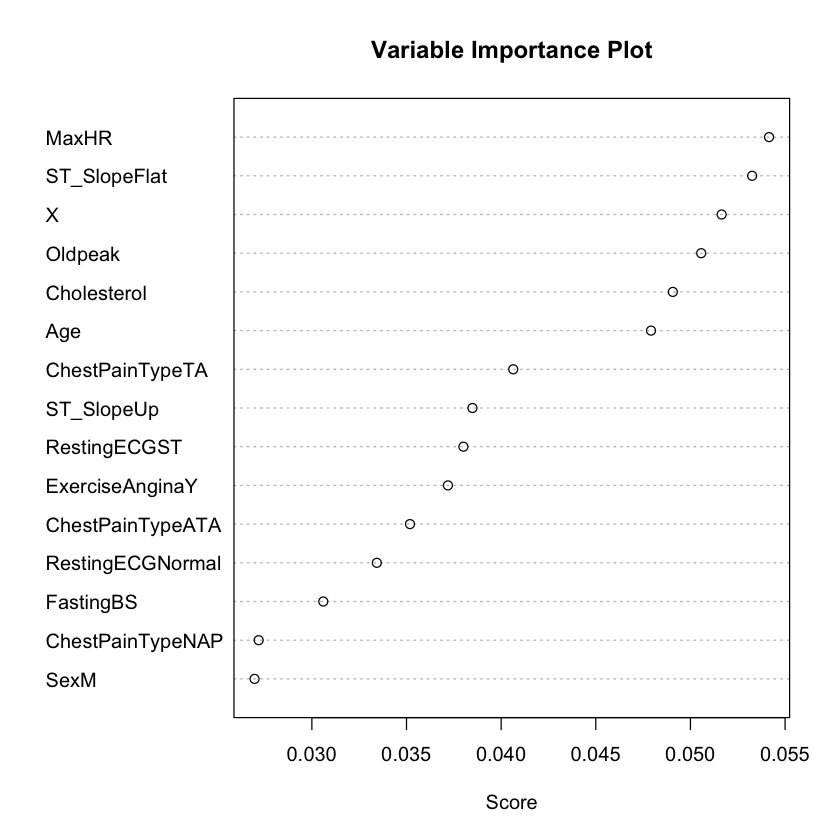

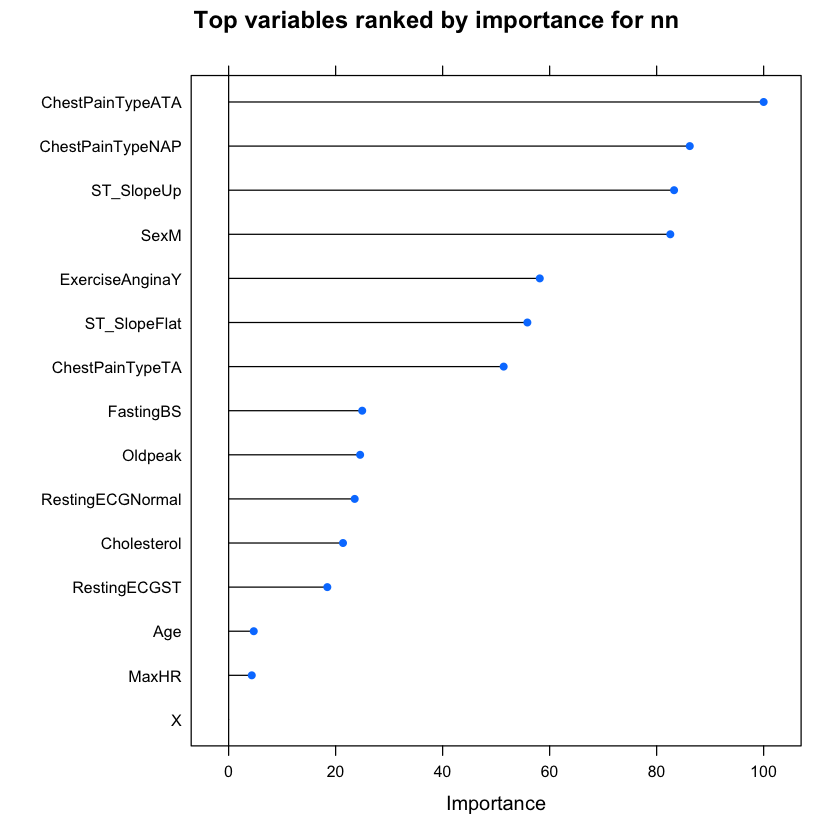

In [46]:
varplot(res_ada$finalModel)
plot(varImp(res_nn), main = "Top variables ranked by importance for nn")

### Visualize training performance

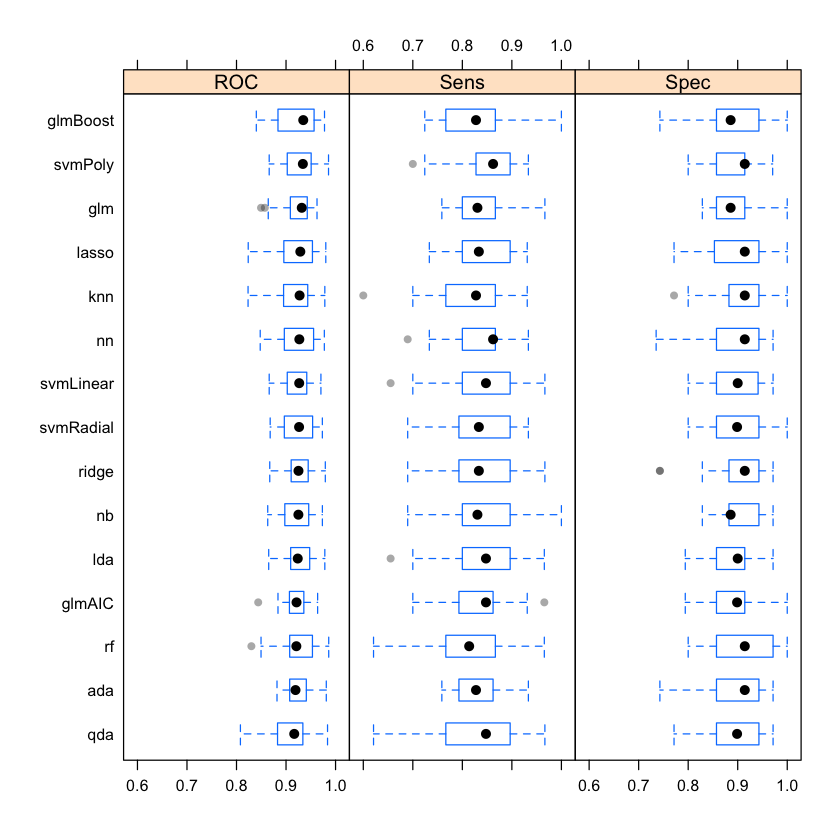

In [14]:
my_resamples <- resamples(list(glm = res_logistic, 
                               lda = res_lda, qda=res_qda, 
                               nb= res_nb, knn=res_knn, 
                               glmAIC = res_glm_AIC,
                              ridge = res_ridge, 
                              lasso = res_lasso,
                              svmLinear = res_svm_linear,
                              svmRadial = res_svm_radial, 
                              svmPoly = res_svm_poly, 
                              ada = res_ada, 
                              glmBoost = res_glm_boost, 
                              rf = res_rf,
                              nn = res_nn                             
                              ))
#summary(my_resamples)

#Plot summary stats
theme1 <- trellis.par.get()
theme1$plot.symbol$col = rgb(.2, .2, .2, .4)
theme1$plot.symbol$pch = 16
theme1$plot.line$col = rgb(1, 0, 0, .7)
theme1$plot.line$lwd <- 2
trellis.par.set(theme1)
bwplot(my_resamples, layout = c(3, 1))

In [75]:
# diffs <- diff(my_resamples)
# summary(diffs)

# Testing 

In [69]:
res <- data.frame(observed = test$HeartDisease)

res$lda <- predict(res_lda, newdata = test)
res$qda <- predict(res_qda, newdata = test)
res$glm <- predict(res_logistic, newdata = test)
res$nb <- predict(res_nb, newdata = test)
res$knn <- predict(res_knn, newdata = test)
res$glmAIC <- predict(res_glm_AIC, newdata = test)
res$ridge <- predict(res_ridge, newdata = test)
res$lasso <- predict(res_lasso, newdata = test)
res$svmLinear <- predict(res_svm_linear, newdata = test)
res$svmRadial <- predict(res_svm_radial, newdata = test)
res$svmPoly <- predict(res_svm_poly, newdata = test)

res$ada <- predict(res_ada, newdata = test)
res$glmBoost <- predict(res_glm_boost, newdata = test)

res$rf <- predict(res_rf, newdata = test)
res$nn <- predict(res_nn, newdata = test)

res_long <- tidyr::pivot_longer(res, -observed)
# Calculate Metrics from Confusions Matrix
confuse <- res_long %>%
    dplyr::group_by(name) %>%
    dplyr::summarise(
        Accuracy = confusionMatrix(value, factor(observed))$overall[1],
        FPR = mean(value[observed == "No"] == "Yes")*100,
        FNR = mean(value[observed == "Yes"] == "No")*100,
        Sensitivity = confusionMatrix(value, factor(observed))$byClass[1], #sensitivity
        F1 = confusionMatrix(value, factor(observed))$byClass[7],
        Precision = confusionMatrix(value, factor(observed))$byClass[5],
        Specificity = confusionMatrix(value, factor(observed))$byClass[2],
        Kappa = confusionMatrix(value, factor(observed))$overall[2],
        .groups = "drop")

confuse

name,Accuracy,FPR,FNR,Sensitivity,F1,Precision,Specificity,Kappa
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ada,0.9127726,11.604096,6.303725,0.8839590,0.9024390,0.9217082,0.9369628,0.8236281
glm,0.8816199,13.993174,10.028653,0.8600683,0.8689655,0.8780488,0.8997135,0.7610320
glmAIC,0.8800623,14.675768,9.742120,0.8532423,0.8665511,0.8802817,0.9025788,0.7576883
glmBoost,0.8769470,15.699659,9.455587,0.8430034,0.8621291,0.8821429,0.9054441,0.7511213
knn,0.8753894,16.723549,8.882521,0.8327645,0.8591549,0.8872727,0.9111748,0.7476241
lasso,0.8847352,13.993174,9.455587,0.8600683,0.8719723,0.8842105,0.9054441,0.7671930
lda,0.8785047,16.040956,8.882521,0.8395904,0.8631579,0.8880866,0.9111748,0.7540689
nb,0.8816199,14.675768,9.455587,0.8532423,0.8680556,0.8833922,0.9054441,0.7607696
nn,0.8862928,13.310580,9.742120,0.8668942,0.8743546,0.8819444,0.9025788,0.7705279


## Visualize predictive performance of various models 

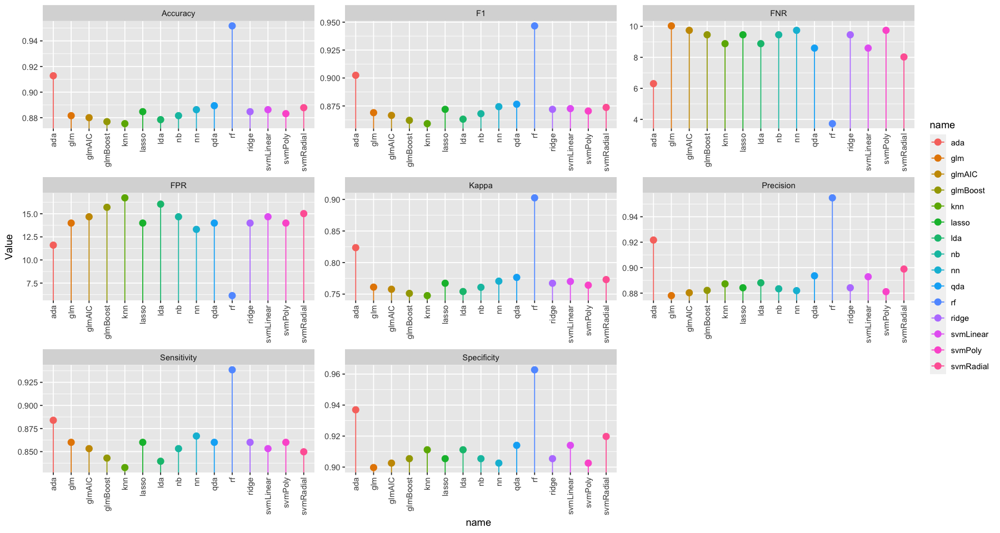

In [70]:
options(repr.plot.width=15, repr.plot.height=8)
confuse %>% tidyr::pivot_longer(!name, names_to = "Measure", values_to = "Value") %>%
    ggplot() + 
        aes(x = name, xend = name, y = Value, colour = name) + 
        geom_point(size = 3) +
        geom_segment(yend = 0) +
        facet_wrap(~ Measure, scales = "free") + theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))


### Create ROC curves

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting leve

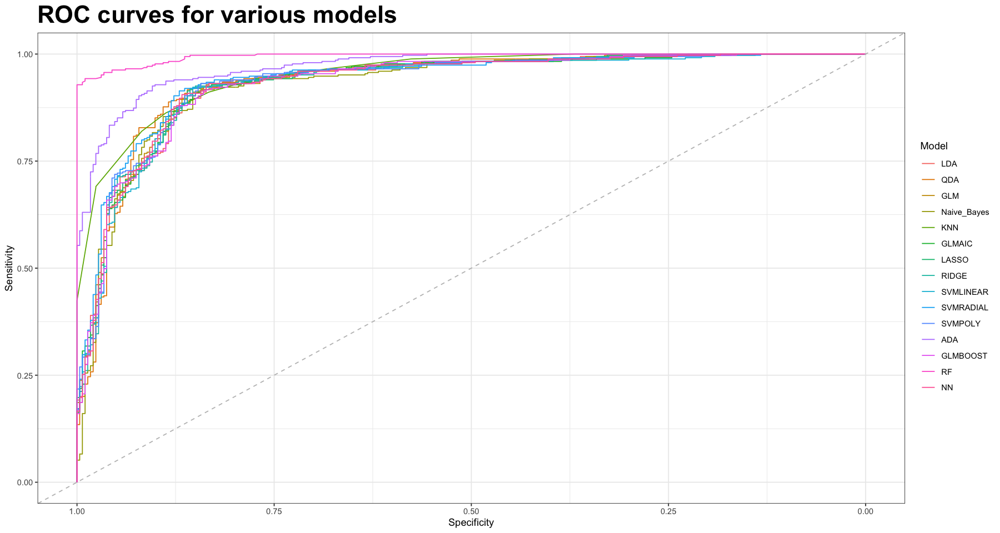

In [28]:

# # ROC Curves
pres <- data.frame(observed = test$HeartDisease)
pres$lda <- predict(res_lda, newdata = test, type = "prob")[,2]
pres$qda <- predict(res_qda, newdata = test, type = "prob")[,2]
pres$glm <- predict(res_logistic, newdata = test, type = "prob")[,2]
pres$nb <- predict(res_nb, newdata = test, type = "prob")[,2]
pres$knn <- predict(res_knn, newdata = test, type = "prob")[,2]
pres$glmAIC <- predict(res_glm_AIC, newdata = test, type = "prob")[,2]
pres$ridge <- predict(res_ridge, newdata = test, type = "prob")[,2]
pres$lasso <- predict(res_lasso, newdata = test, type = "prob")[,2]

pres$svmLinear <- predict(res_svm_linear, newdata = test, type = "prob")[,2]
pres$svmRadial <- predict(res_svm_radial, newdata = test, type = "prob")[,2]
pres$svmPoly <- predict(res_svm_poly, newdata = test, type = "prob")[,2]

pres$ada <- predict(res_ada, newdata = test, type = "prob")[,2]
pres$glmBoost <- predict(res_glm_boost, newdata = test, type = "prob")[,2]
pres$rf <- predict(res_rf, newdata = test, type = "prob")[,2]
pres$nn <- predict(res_nn, newdata = test, type = "prob")[,2]

pres$observed <- ifelse(pres$observed == "No", 0, 1)

rocs <- list(
    LDA = roc(as.numeric(pres$observed), as.numeric(pres$lda)),
    QDA = roc(as.numeric(pres$observed), as.numeric(pres$qda)),
    GLM = roc(as.numeric(pres$observed), as.numeric(pres$glm)),
    Naive_Bayes = roc(as.numeric(pres$observed), as.numeric(pres$nb)),
    KNN = roc(as.numeric(pres$observed), as.numeric(pres$knn)),
    GLMAIC = roc(as.numeric(pres$observed), as.numeric(pres$glmAIC)),
    LASSO =  roc(as.numeric(pres$observed), as.numeric(pres$lasso)),
    RIDGE =  roc(as.numeric(pres$observed), as.numeric(pres$ridge)),
    SVMLINEAR = roc(as.numeric(pres$observed), as.numeric(pres$svmLinear)),
    SVMRADIAL = roc(as.numeric(pres$observed), as.numeric(pres$svmRadial)),
    SVMPOLY = roc(as.numeric(pres$observed), as.numeric(pres$svmPoly)),
    ADA = roc(as.numeric(pres$observed), as.numeric(pres$ada)),
    GLMBOOST = roc(as.numeric(pres$observed), as.numeric(pres$glmBoost)),
    RF = roc(as.numeric(pres$observed), as.numeric(pres$rf)),
    NN = roc(as.numeric(pres$observed), as.numeric(pres$nn))

)
ggroc(rocs) + theme_bw() +
    labs(x = "Specificity", y = "Sensitivity",
        colour = "Model") +
    geom_abline(intercept = 1, slope = 1, colour = "grey", 
        linetype = "dashed") + ggtitle("ROC curves for various models") + 
        theme(plot.title = element_text(size = 26, face = "bold"))


### Create a lift chart

In [ ]:
pres <- data.frame(observed = test$HeartDisease)
pres$lda <- predict(res_lda, newdata = test, type = "prob")[,1]
pres$qda <- predict(res_qda, newdata = test, type = "prob")[,1]
pres$glm <- predict(res_logistic, newdata = test, type = "prob")[,1]
pres$nb <- predict(res_nb, newdata = test, type = "prob")[,1]
pres$knn <- predict(res_knn, newdata = test, type = "prob")[,1]
pres$glmAIC <- predict(res_glm_AIC, newdata = test, type = "prob")[,1]
pres$ridge <- predict(res_ridge, newdata = test, type = "prob")[,1]
pres$lasso <- predict(res_lasso, newdata = test, type = "prob")[,1]

pres$svmLinear <- predict(res_svm_linear, newdata = test, type = "prob")[,1]
pres$svmRadial <- predict(res_svm_radial, newdata = test, type = "prob")[,1]
pres$svmPoly <- predict(res_svm_poly, newdata = test, type = "prob")[,1]

pres$ada <- predict(res_ada, newdata = test, type = "prob")[,1]
pres$glmBoost <- predict(res_glm_boost, newdata = test, type = "prob")[,1]
pres$rf <- predict(res_rf, newdata = test, type = "prob")[,1]
pres$nn <- predict(res_nn, newdata = test, type = "prob")[,1]

pres$observed <- ifelse(pres$observed == "No", 0, 1)

Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collapsing to unique 'x' values”
Warning message in regularize.values(x, y, ties, missing(ties), na.rm = na.rm):
“collaps

ERROR: Error in title("Lift curves for various models"): plot.new has not been called yet


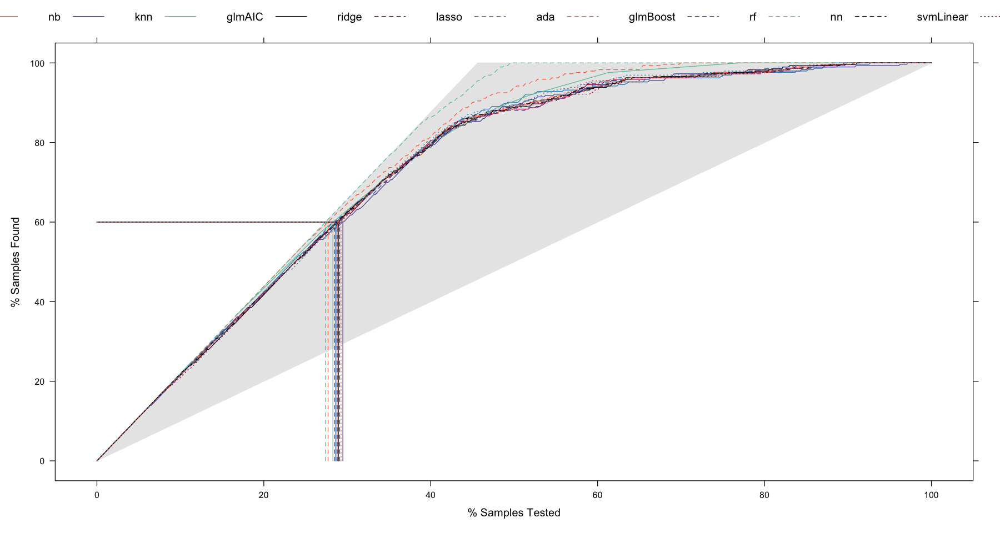

In [31]:
trellis.par.set(caretTheme())
lift_obj <- caret::lift(factor(observed) ~ lda + qda + glm + nb + knn + 
                        glmAIC + ridge + lasso + ada + glmBoost + rf + nn + svmLinear + svmRadial + svmPoly, 
                        data = pres)
plot(lift_obj, values = 60, auto.key = list(columns = 15,
                                            lines = TRUE,
                                            points = FALSE)) 


From this we can see that, to find 60% of the hits, a little less than 30% of the data can be sampled (when ordered by the probability predictions). The random forest (rf) model does somewhat better than the others.



### Plotting test error

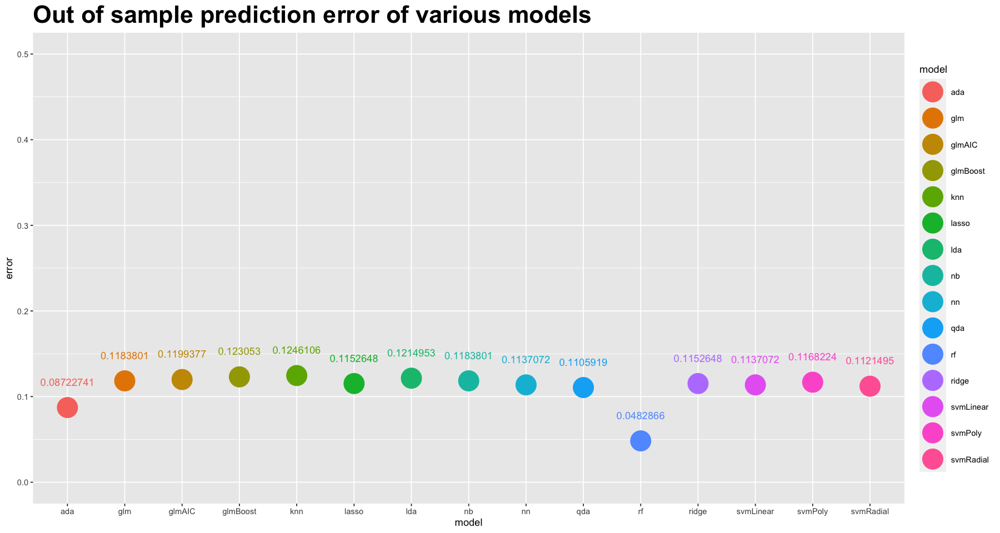

In [18]:
#Get test error
pres2 <- data.frame(observed = test$HeartDisease)
pres2$lda = ifelse(pres$lda > 0.5, "Yes", "No") 
pres2$qda <- ifelse(pres$qda > 0.5, "Yes", "No") 
pres2$glm <- ifelse(pres$glm > 0.5, "Yes", "No") 
pres2$nb <- ifelse(pres$nb > 0.5, "Yes", "No") 
pres2$knn <- ifelse(pres$knn > 0.5, "Yes", "No") 
pres2$glmAIC <- ifelse(pres$glmAIC > 0.5, "Yes", "No") 
pres2$ridge <- ifelse(pres$ridge > 0.5,"Yes", "No") 
pres2$lasso <- ifelse(pres$lasso > 0.5, "Yes", "No") 

pres2$svmLinear <- ifelse(pres$svmLinear > 0.5, "Yes", "No") 
pres2$svmRadial <- ifelse(pres$svmRadial > 0.5,"Yes", "No") 
pres2$svmPoly <- ifelse(pres$svmPoly > 0.5, "Yes", "No") 

pres2$ada <- ifelse(pres$ada > 0.5, "Yes", "No") 
pres2$glmBoost <-ifelse(pres$glmBoost > 0.5, "Yes", "No") 
pres2$rf <- ifelse(pres$rf > 0.5, "Yes", "No") 
pres2$nn <- ifelse(pres$nn > 0.5, "Yes", "No") 


errors = data.frame(model = c("lda", "qda", "glm", "nb", "knn", "glmAIC", "ridge", "lasso", 
                             "svmLinear","svmRadial","svmPoly","ada","glmBoost", "rf", "nn"
                             ))


errors$error <- c( mean(pres2$lda != pres2$observed),
    mean(pres2$qda != pres2$observed),
    mean(pres2$glm != pres2$observed),
    mean(pres2$nb != pres2$observed),
    mean(pres2$knn != pres2$observed),
    mean(pres2$glmAIC != pres2$observed),
    mean(pres2$ridge != pres2$observed),
    mean(pres2$lasso != pres2$observed),
    mean(pres2$svmLinear != pres2$observed),
    mean(pres2$svmRadial != pres2$observed),
    mean(pres2$svmPoly != pres2$observed),
    mean(pres2$ada != pres2$observed),
    mean(pres2$glmBoost != pres2$observed),
    mean(pres2$rf != pres2$observed),
    mean(pres2$nn != pres2$observed)
) 


errors %>% ggplot() + 
        aes(x = model, y = error, colour = model) + 
        geom_point(size = 10) + ylim(0, 0.5)+ geom_text(aes(label = error),parse = TRUE, nudge_y=0.03) +
        ggtitle("Out of sample prediction error of various models") + 
        theme(plot.title = element_text(size = 26, face = "bold"))
